In [1]:
import shap
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    log_loss, roc_auc_score
)
from sklearn.inspection import permutation_importance
from sklearn.inspection import PartialDependenceDisplay
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import ConfusionMatrixDisplay

sns.set_style("whitegrid")

C:\Users\stefan.jovanovic_omi\Desktop\MasterElfak-Masinsko-Ucenje\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv('../data/urban_lifestyle_impact_dataset.csv')
df.sample(10)

,daily_travel_time,vehicle_ownership,location_type,nearby_industries,green_space_access,home_air_quality,work_location_type,smoker_in_household,noise_pollution_level,use_of_air_purifiers,awareness_level,years_in_location,pollution_exposure_score,risk_category
4883,54.5,Car,Urban,3.0,Low,79.1,Factory,True,29.1,True,Low,34.0,73.47,High
6009,28.3,Two-wheeler,Urban,1.0,Low,80.7,Office,False,51.0,False,High,15.0,34.34,Medium
9334,55.2,Two-wheeler,Rural,2.0,Moderate,67.3,Fieldwork,True,60.5,False,High,24.0,43.39,Medium
1864,71.1,Two-wheeler,Urban,3.0,Low,43.4,Fieldwork,False,61.9,True,Low,30.0,73.93,High
9931,28.1,NaN,Urban,0.0,Moderate,53.0,Office,True,52.8,False,Medium,21.0,26.49,Low
2243,13.7,NaN,Urban,1.0,Moderate,65.1,Office,False,66.9,False,Medium,3.0,25.18,Low
9230,43.9,Car,Urban,5.0,Low,69.5,Factory,False,14.6,True,High,13.0,67.86,Medium
7249,15.6,Public Only,Rural,1.0,Moderate,42.7,Remote,False,59.8,True,High,1.0,16.27,Low
6969,61.5,NaN,Urban,2.0,Moderate,52.4,Office,False,52.5,False,NaN,33.0,43.45,Medium
4367,45.6,Public Only,Semi-Urban,4.0,Moderate,58.4,Remote,False,45.3,True,Medium,8.0,31.74,Medium


In [3]:
# Print unique values for object columns
for col in df.select_dtypes(include="object").columns:
    unique_vals = df[col].dropna().unique()
    print(f"Column: {col}, Unique Values ({len(unique_vals)}): {unique_vals[:10]}{'...' if len(unique_vals) > 10 else ''}")

Column: vehicle_ownership, Unique Values (3): ['Public Only' 'Car' 'Two-wheeler']
Column: location_type, Unique Values (3): ['Semi-Urban' 'Urban' 'Rural']
Column: green_space_access, Unique Values (3): ['Moderate' 'High' 'Low']
Column: work_location_type, Unique Values (4): ['Factory' 'Remote' 'Office' 'Fieldwork']
Column: awareness_level, Unique Values (3): ['Low' 'Medium' 'High']
Column: risk_category, Unique Values (3): ['Medium' 'High' 'Low']


In [4]:
# Print number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of rows: 10000
Number of columns: 14
Number of duplicate rows: 0


In [5]:
# Print column and type
for col, dtype in df.dtypes.items():
    mem_usage = df[col].memory_usage(deep=True)
    print(f"{col} - {dtype} ({mem_usage:,} bytes)")

daily_travel_time - float64 (80,132 bytes)
vehicle_ownership - object (493,468 bytes)
location_type - object (555,602 bytes)
nearby_industries - float64 (80,132 bytes)
green_space_access - object (534,552 bytes)
home_air_quality - float64 (80,132 bytes)
work_location_type - object (544,487 bytes)
smoker_in_household - bool (10,132 bytes)
noise_pollution_level - float64 (80,132 bytes)
use_of_air_purifiers - bool (10,132 bytes)
awareness_level - object (513,343 bytes)
years_in_location - float64 (80,132 bytes)
pollution_exposure_score - float64 (80,132 bytes)
risk_category - object (546,108 bytes)


In [6]:
issues = {}

for col in df.columns:
    dtype = df[col].dtype

    bad_rows = []
    for idx, val in df[col].items():
        if pd.isna(val):
            continue

        try:
            if np.issubdtype(dtype, np.number):
                _ = float(val)
            elif np.issubdtype(dtype, np.bool_):
                if str(val).lower() not in ["true", "false", "0", "1"]:
                    raise ValueError
            elif np.issubdtype(dtype, np.datetime64):
                pd.to_datetime(val)
            else:
                pass
        except Exception:
            bad_rows.append((idx, val))

    if bad_rows:
        issues[col] = bad_rows

if not issues:
    print("All values match their declared column dtypes.")
else:
    for col, bad_rows in issues.items():
        print(f"Column: {col} (expected {df[col].dtype})")
        for idx, val in bad_rows[:10]:
            print(f"  Row {idx}: {val}")

All values match their declared column dtypes.


In [7]:
# Print percentage of missing values per column
for col in df.columns:
    missing_percentage = df[col].isnull().mean() * 100
    print(f"{col}: {missing_percentage:.2f}% missing values")

daily_travel_time: 11.24% missing values
vehicle_ownership: 31.64% missing values
location_type: 0.00% missing values
nearby_industries: 7.95% missing values
green_space_access: 5.60% missing values
home_air_quality: 0.00% missing values
work_location_type: 6.53% missing values
smoker_in_household: 0.00% missing values
noise_pollution_level: 0.00% missing values
use_of_air_purifiers: 0.00% missing values
awareness_level: 10.15% missing values
years_in_location: 5.20% missing values
pollution_exposure_score: 0.00% missing values
risk_category: 0.00% missing values


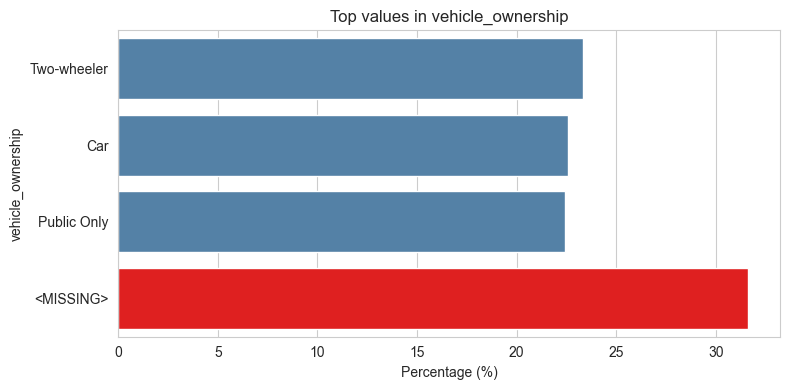

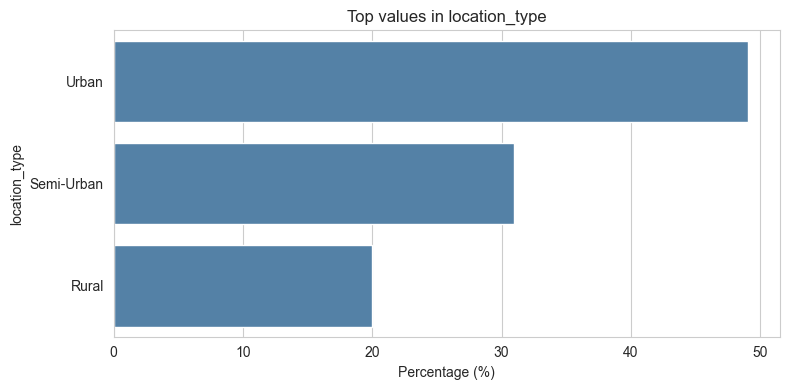

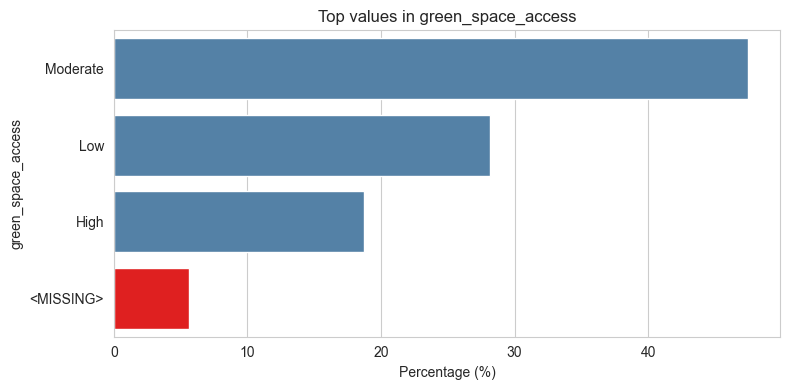

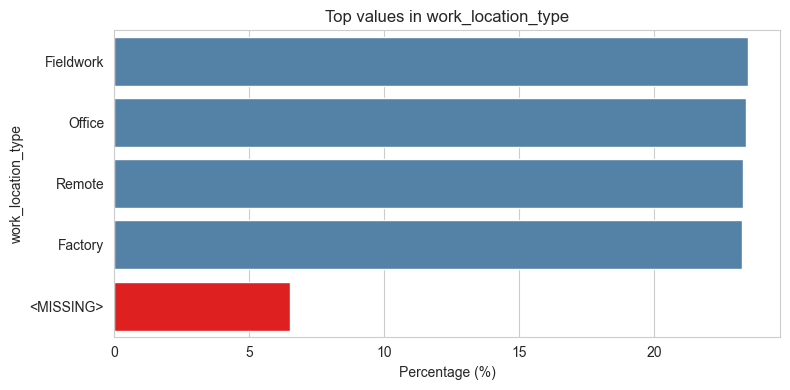

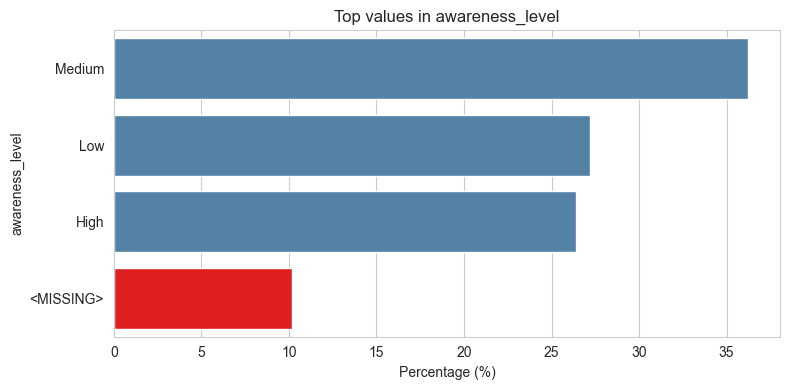

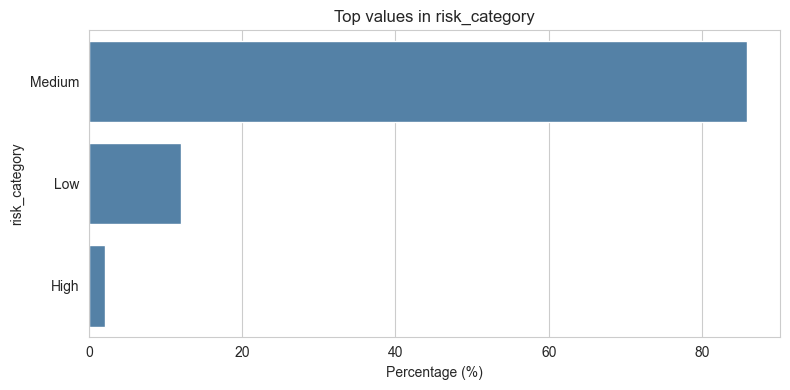

In [8]:
for col in df.select_dtypes(include="object"):
    # Top 10 + missing %
    counts = df[col].value_counts(dropna=True).head(10)
    counts = counts / len(df) * 100

    missing = df[col].isna().sum()
    if missing > 0:
        counts["<MISSING>"] = (missing / len(df)) * 100

    # Build a DataFrame for seaborn
    plot_df = counts.reset_index()
    plot_df.columns = [col, "Percentage"]

    # Define colors
    color_map = {v: "red" if v == "<MISSING>" else "steelblue" for v in plot_df[col]}

    plt.figure(figsize=(8, 4))
    ax = sns.barplot(
        data=plot_df,
        y=col,
        x="Percentage",
        hue=col,
        palette=color_map,
        orient="h",
        dodge=False,
        legend=False
    )

    ax.set_title(f"Top values in {col}")
    ax.set_xlabel("Percentage (%)")
    ax.set_ylabel(col)
    plt.tight_layout()
    plt.show()


In [9]:
# Convert 'bool' columns to 0/1
bool_cols = df.select_dtypes(include="bool").columns
for col in bool_cols:
    df[col] = df[col].astype(int)

In [10]:
# Print for each numeric column mean, median, std, min, max, quantiles
for col in df.select_dtypes(include="number"):
    print(f"{col}:")
    print(f"  Mean: {df[col].mean():,.2f}")
    print(f"  Median: {df[col].median():,.2f}")
    print(f"  Std: {df[col].std():,.2f}")
    print(f"  Min: {df[col].min():,.2f}")
    print(f"  Max: {df[col].max():,.2f}")
    print(f"  25th percentile: {df[col].quantile(0.25):,.2f}")
    print(f"  50th percentile: {df[col].quantile(0.50):,.2f}")
    print(f"  75th percentile: {df[col].quantile(0.75):,.2f}")

daily_travel_time:
  Mean: 45.15
  Median: 45.00
  Std: 19.89
  Min: 0.00
  Max: 123.50
  25th percentile: 31.60
  50th percentile: 45.00
  75th percentile: 58.52
nearby_industries:
  Mean: 1.99
  Median: 2.00
  Std: 1.42
  Min: 0.00
  Max: 10.00
  25th percentile: 1.00
  50th percentile: 2.00
  75th percentile: 3.00
home_air_quality:
  Mean: 60.11
  Median: 60.20
  Std: 15.16
  Min: 0.00
  Max: 100.00
  25th percentile: 49.80
  50th percentile: 60.20
  75th percentile: 70.50
smoker_in_household:
  Mean: 0.21
  Median: 0.00
  Std: 0.41
  Min: 0.00
  Max: 1.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 0.00
noise_pollution_level:
  Mean: 50.12
  Median: 50.10
  Std: 20.05
  Min: 0.00
  Max: 100.00
  25th percentile: 36.80
  50th percentile: 50.10
  75th percentile: 63.60
use_of_air_purifiers:
  Mean: 0.30
  Median: 0.00
  Std: 0.46
  Min: 0.00
  Max: 1.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 1.00
years_in_location:
  Mean: 20.62
  Me

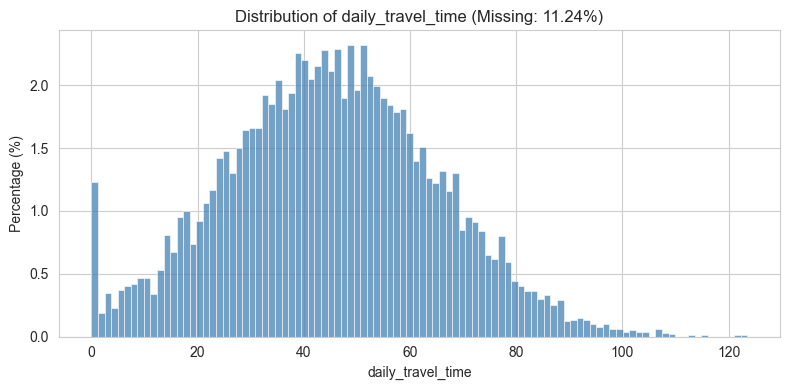

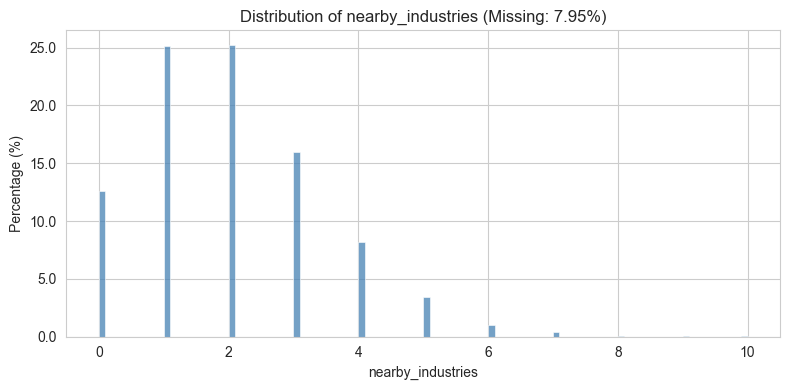

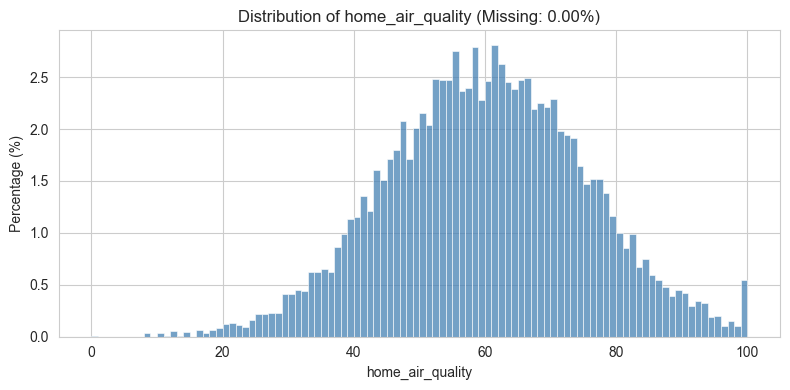

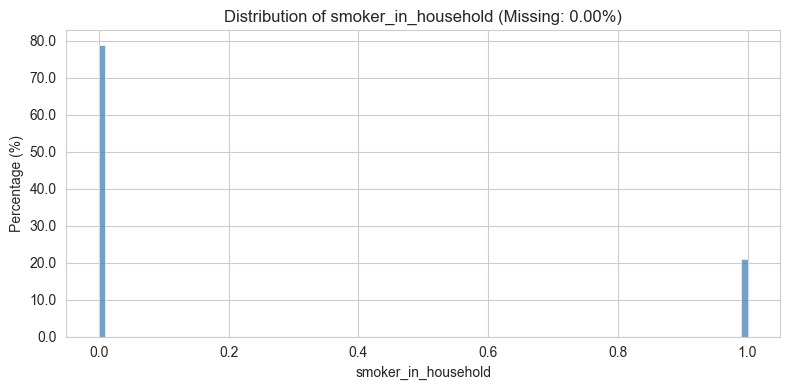

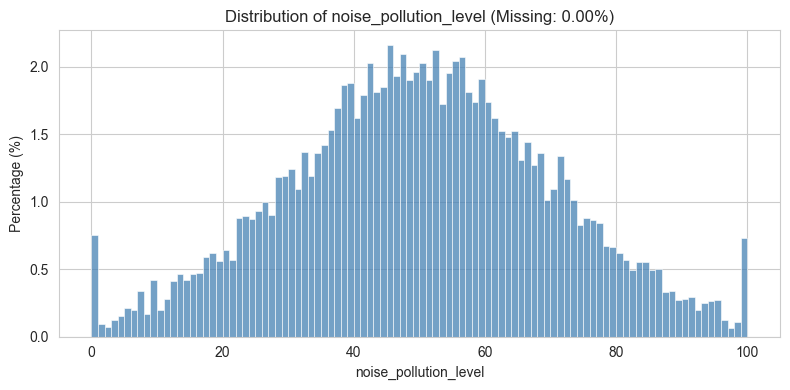

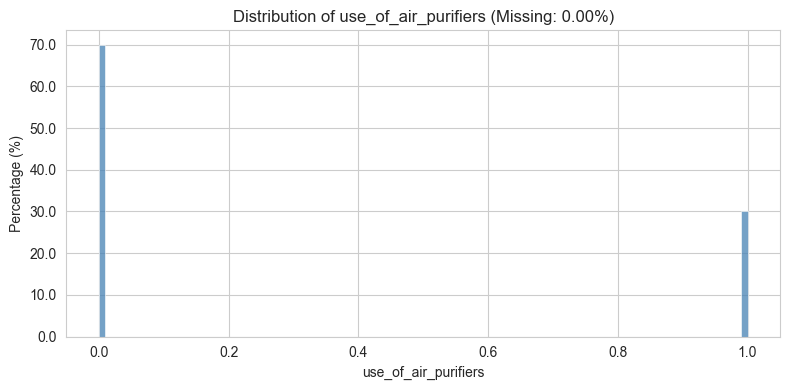

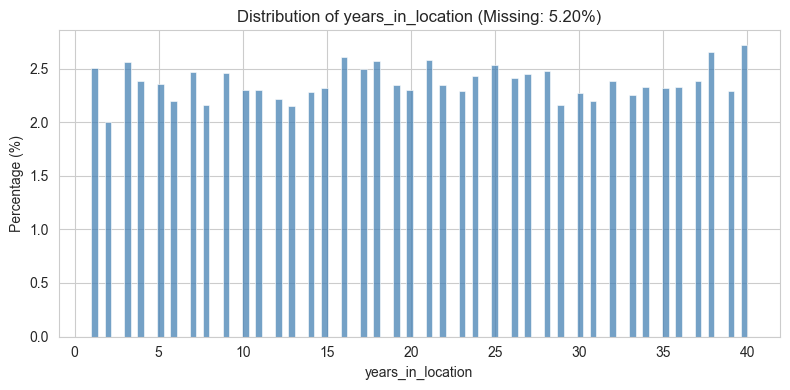

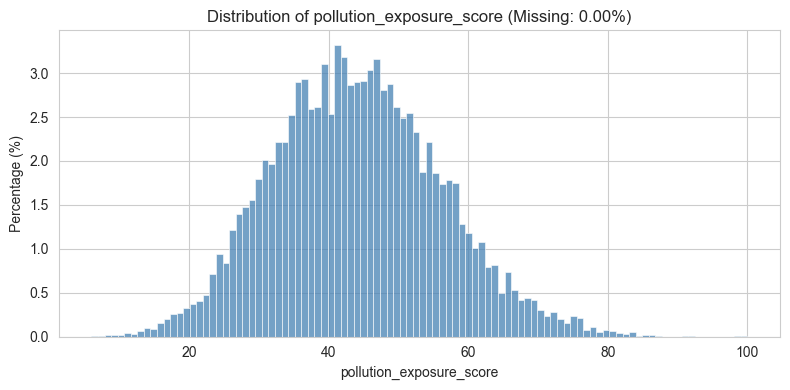

In [11]:
# For each numeric column, plot histogram with percentage on y-axis
for col in df.select_dtypes(include="number"):
    s = df[col]
    total = len(s)
    missing_pct = s.isna().mean() * 100

    plt.figure(figsize=(8, 4))
    ax = sns.histplot(
        s.dropna(),
        bins=100,
        stat="count",      # raw counts, we'll format y-axis
        color="steelblue",
        edgecolor=None
    )

    # Show y-axis as % of total rows
    ax.yaxis.set_major_formatter(
        FuncFormatter(lambda y, _: f"{(y/total)*100:.1f}")
    )

    ax.set_title(f"Distribution of {col} (Missing: {missing_pct:.2f}%)")
    ax.set_xlabel(col)
    ax.set_ylabel("Percentage (%)")

    plt.tight_layout()
    plt.show()

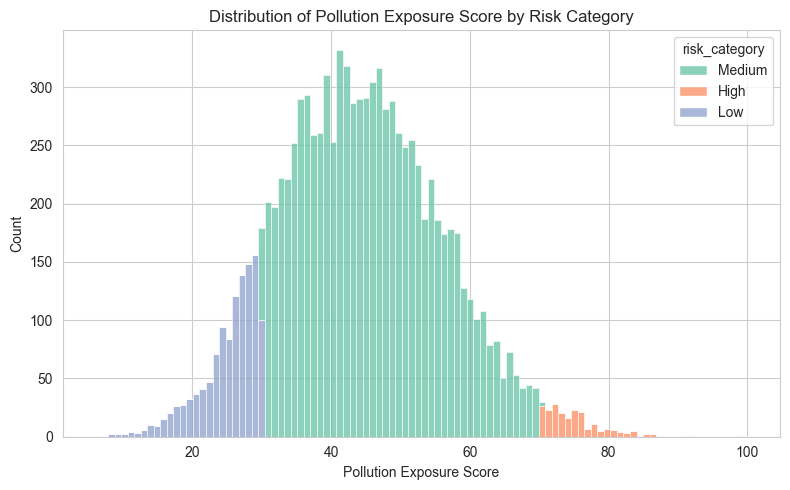

In [12]:
# Histogram of pollution_exposure_score colored by risk_category
plt.figure(figsize=(8, 5))
sns.histplot(
    data=df,
    x="pollution_exposure_score",
    hue="risk_category",
    multiple="stack",
    bins=100,
    palette="Set2",
    edgecolor=None
)

plt.title("Distribution of Pollution Exposure Score by Risk Category")
plt.xlabel("Pollution Exposure Score")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Correlation Heatmap of Numeric Columns')

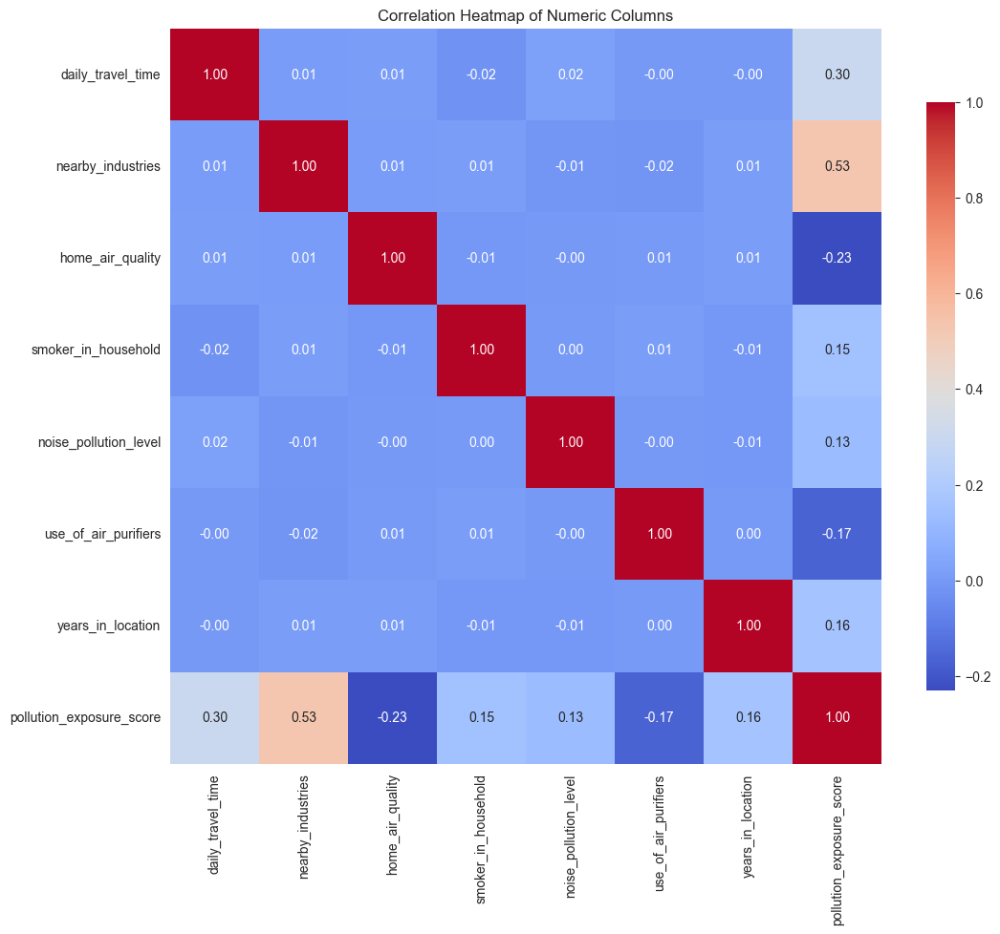

In [13]:
# Plot correlation heatmap of numeric columns
plt.figure(figsize=(12, 10))
corr = df[[col for col in df.select_dtypes(include="number")]].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap of Numeric Columns")

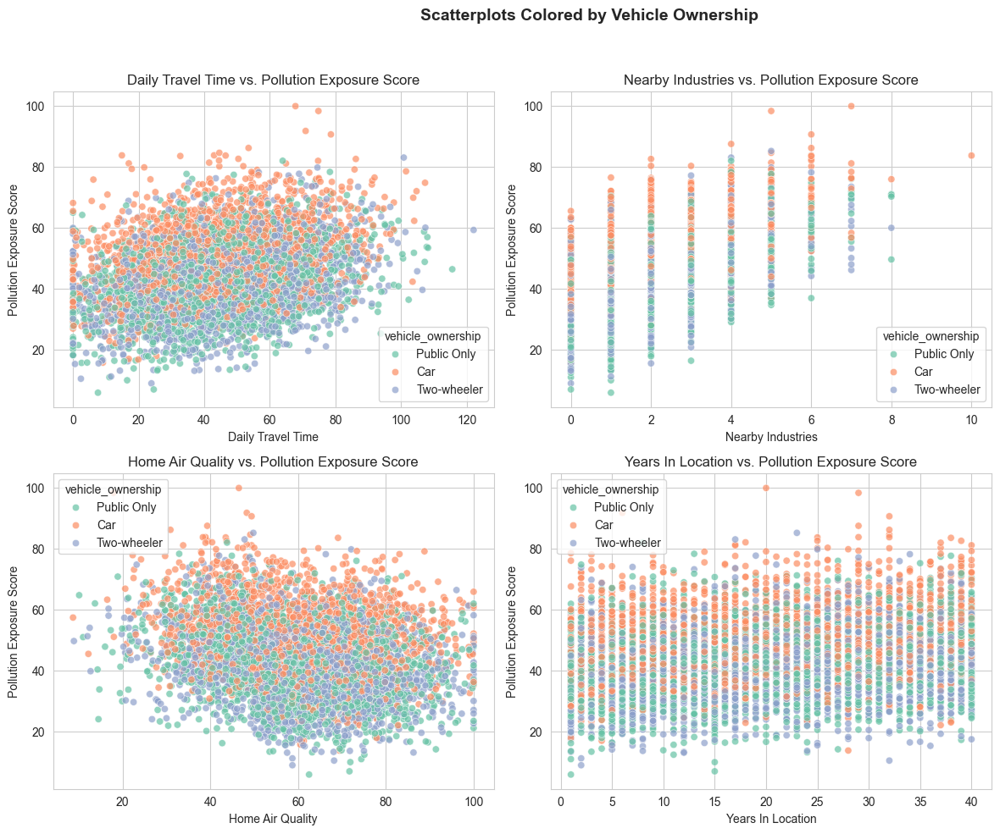

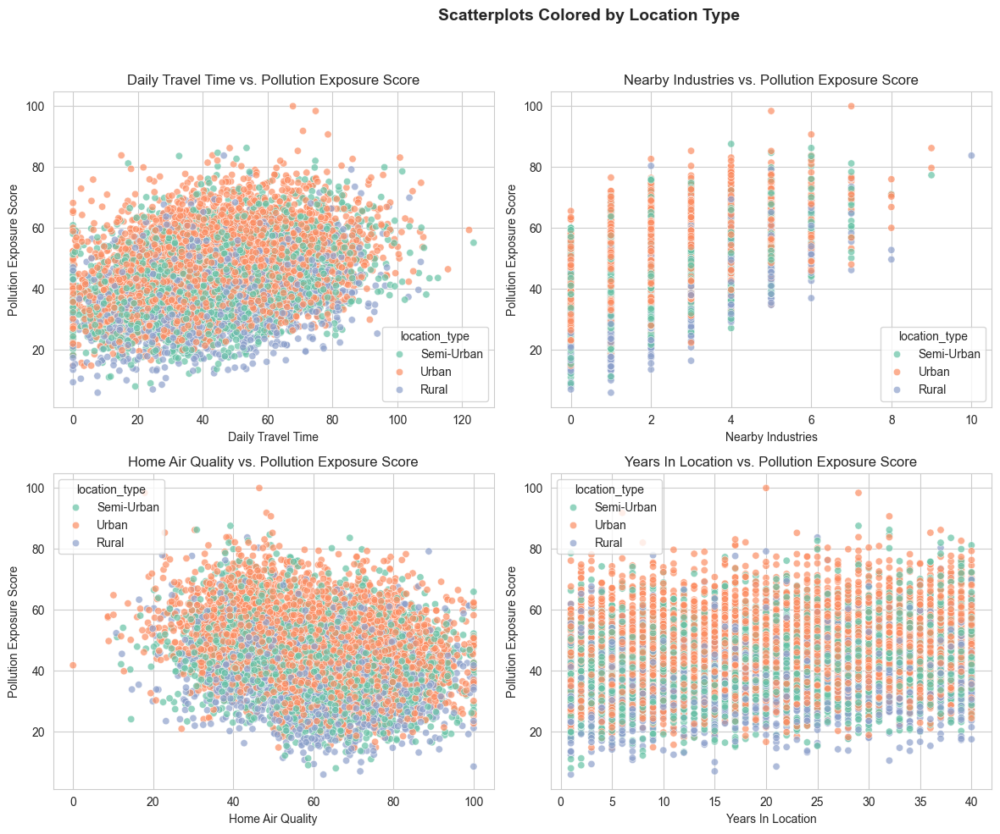

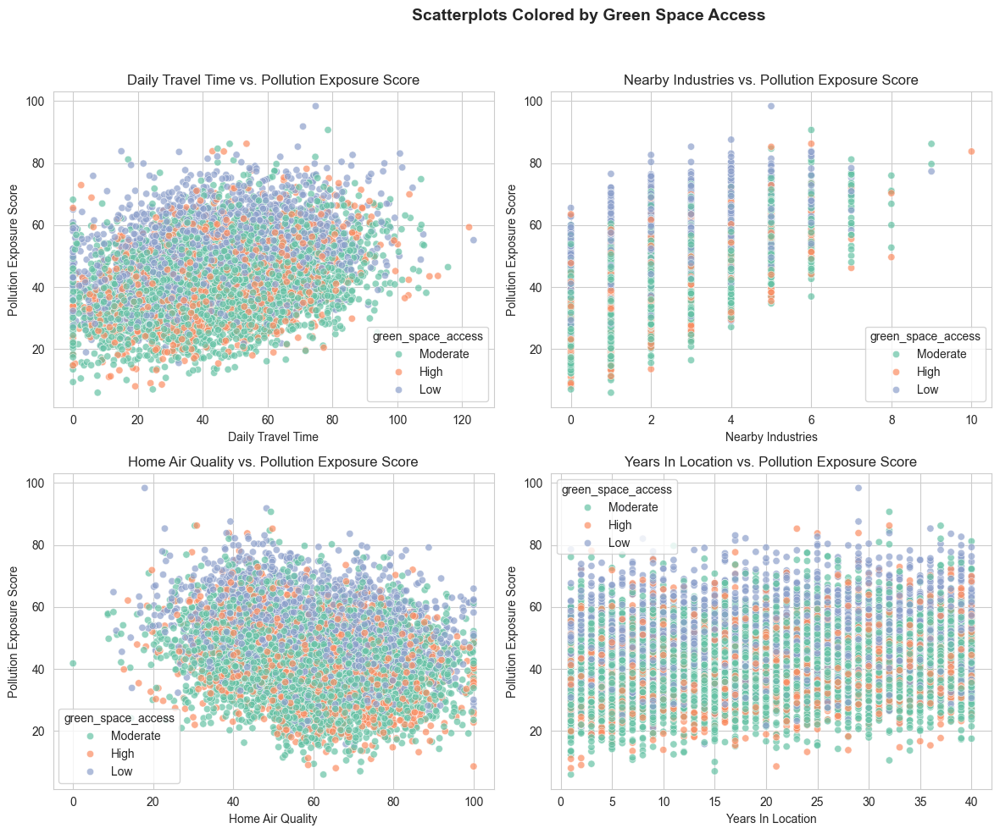

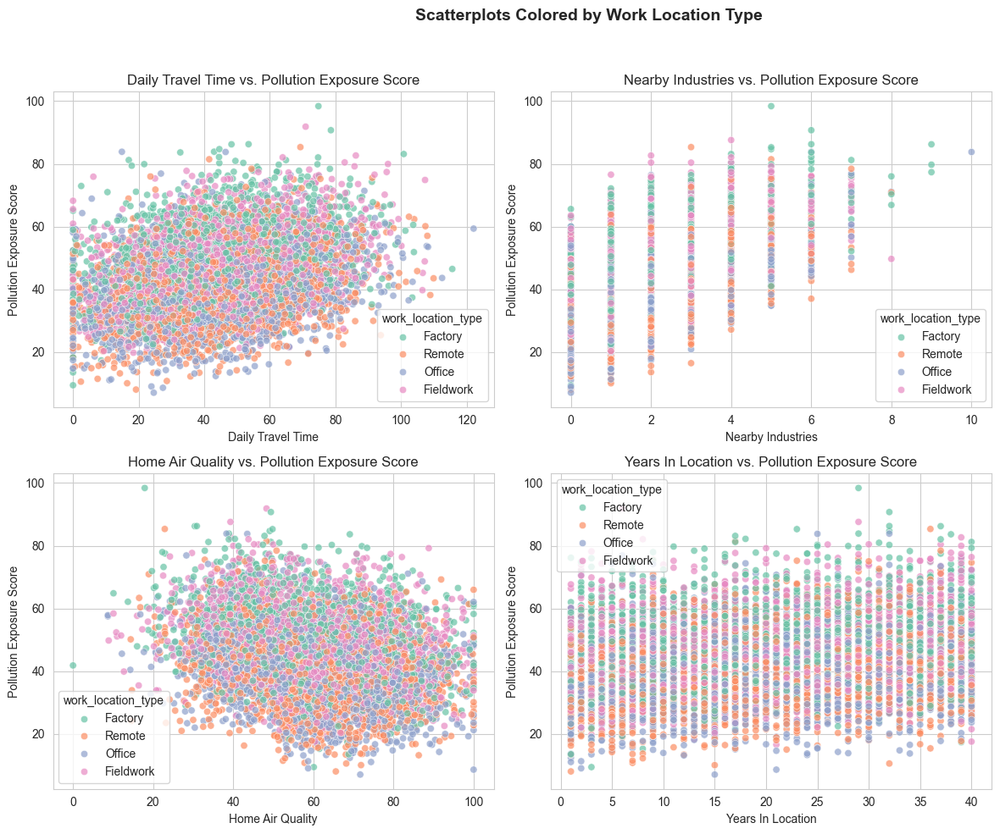

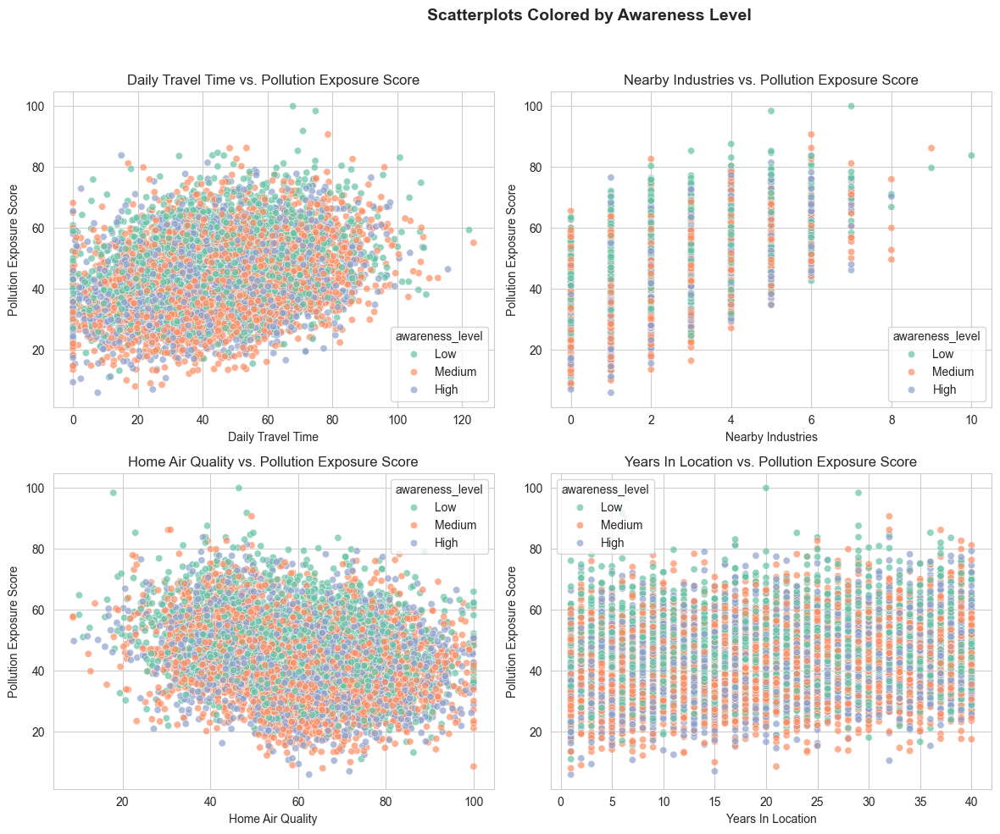

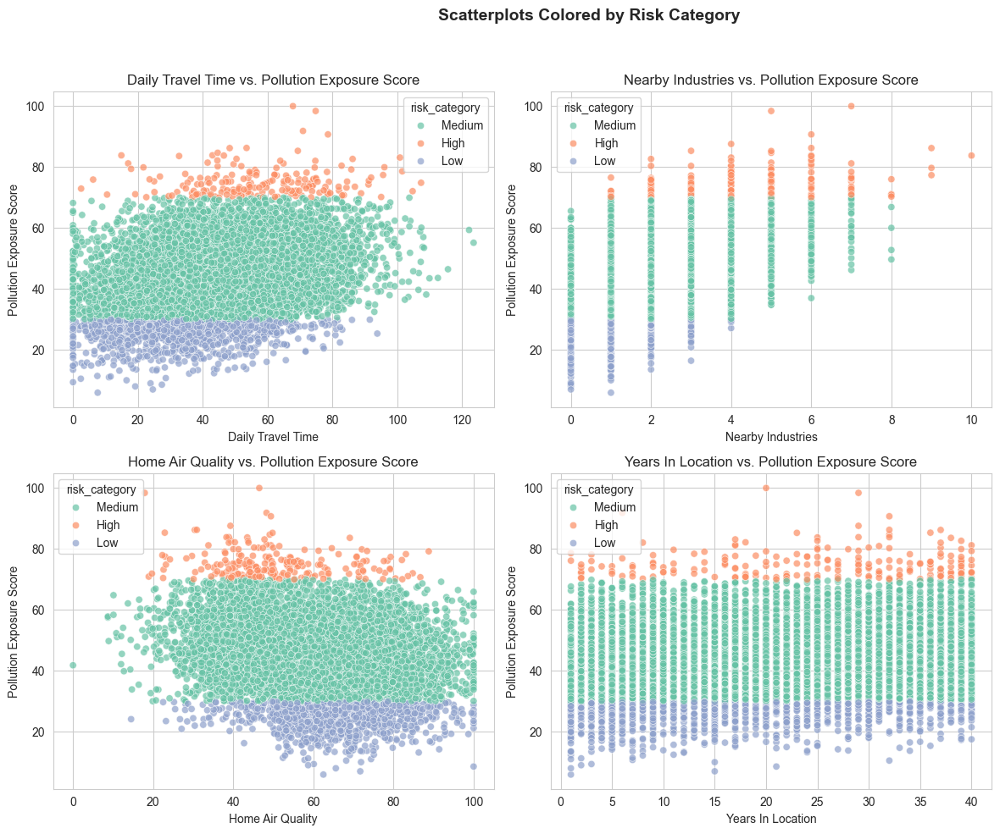

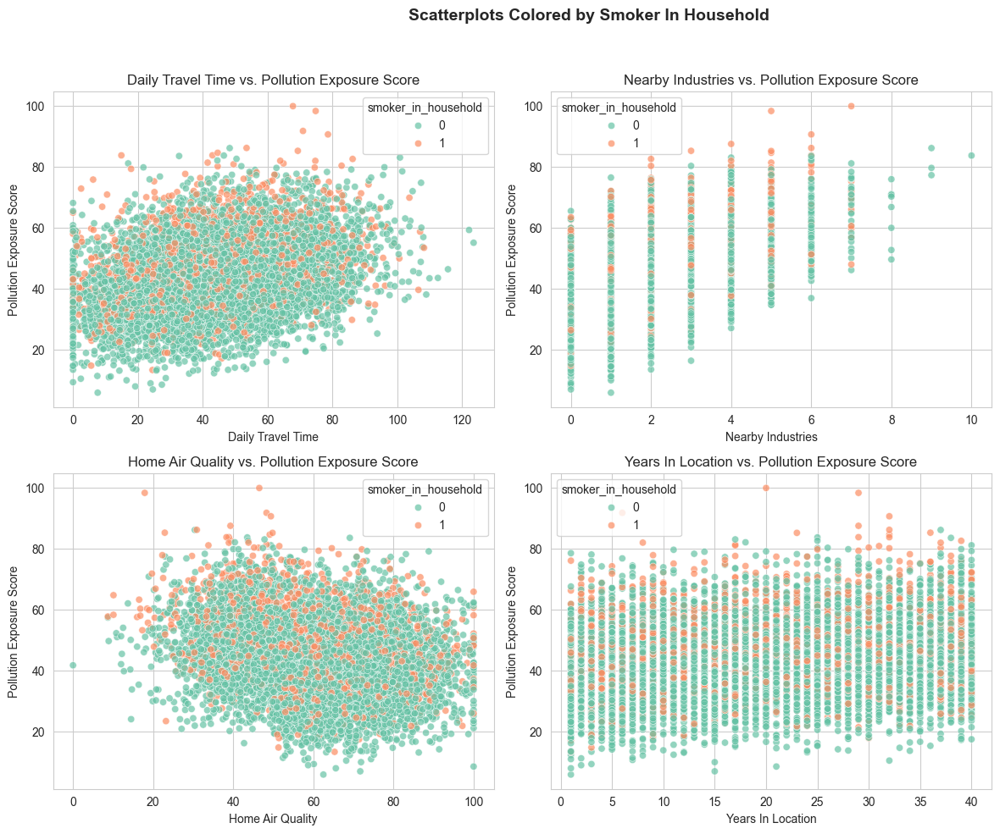

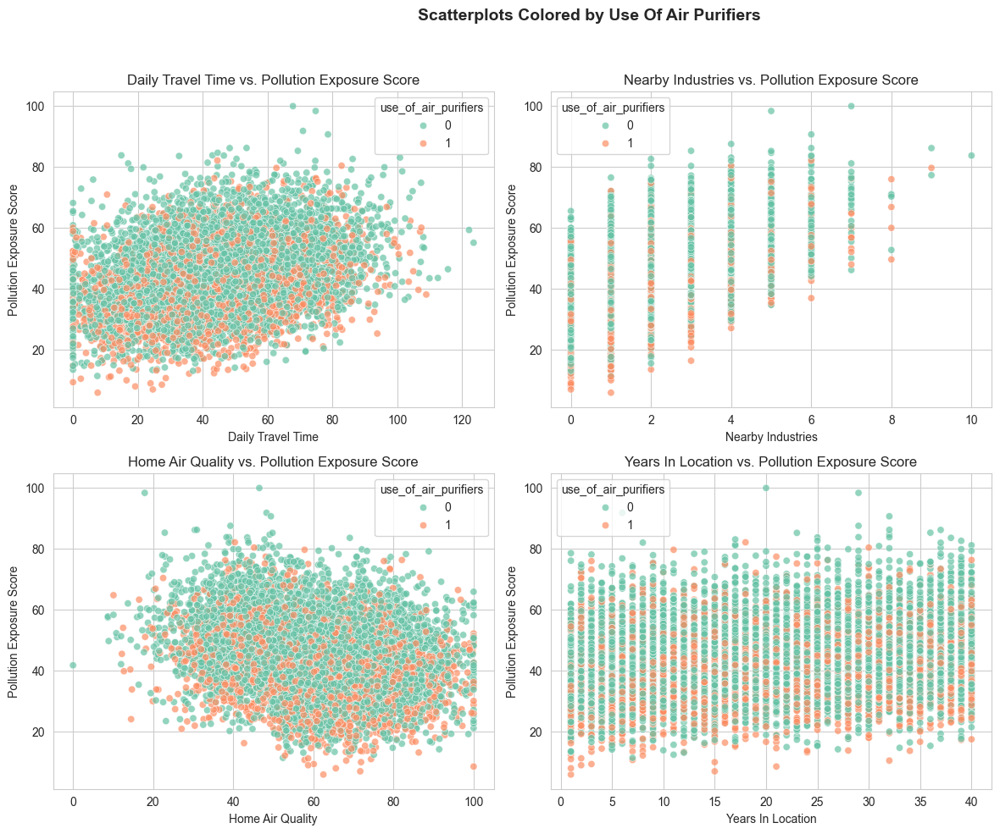

In [14]:
# Scatterplot pairs
scatter_pairs = [
    ('daily_travel_time', 'pollution_exposure_score'),
    ('nearby_industries', 'pollution_exposure_score'),
    ('home_air_quality', 'pollution_exposure_score'),
    ('years_in_location', 'pollution_exposure_score'),
]

# Hue features to iterate over
hue_features = [
    "vehicle_ownership",
    "location_type",
    "green_space_access",
    "work_location_type",
    "awareness_level",
    "risk_category",
    "smoker_in_household",
    "use_of_air_purifiers"
]

# Plot one figure per hue feature
for hue_feature in hue_features:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for ax, (x_col, y_col) in zip(axes, scatter_pairs):
        sns.scatterplot(
            data=df,
            x=x_col,
            y=y_col,
            hue=hue_feature,
            alpha=0.7,
            palette="Set2",
            ax=ax
        )
        ax.set_title(
            f"{x_col.replace('_', ' ').title()} vs. {y_col.replace('_', ' ').title()}",
            fontsize=12
        )
        ax.set_xlabel(x_col.replace('_', ' ').title())
        ax.set_ylabel(y_col.replace('_', ' ').title())

    # Put legend outside to keep plots clean
    handles, labels = axes[0].get_legend_handles_labels()

    fig.suptitle(f"Scatterplots Colored by {hue_feature.replace('_', ' ').title()}",
                 fontsize=14, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    plt.show()

In [15]:
# Ordinal encodings
vehicle_map = {"Public Only": 0, "Two-wheeler": 1, "Car": 2}
location_map = {"Rural": 0, "Semi-Urban": 1, "Urban": 2}
green_space_map = {"Low": 0, "Moderate": 1, "High": 2}
work_map = {"Remote": 0, "Office": 1, "Fieldwork": 2, "Factory": 3}
awareness_map = {"Low": 0, "Medium": 1, "High": 2}
risk_map = {"Low": 0, "Medium": 1, "High": 2}

df_cat_encoded = df.copy()

# Save original columns with _original suffix
df_cat_encoded["vehicle_ownership"] = df_cat_encoded["vehicle_ownership"].map(vehicle_map)
df_cat_encoded["location_type"] = df_cat_encoded["location_type"].map(location_map)
df_cat_encoded["green_space_access"] = df_cat_encoded["green_space_access"].map(green_space_map)
df_cat_encoded["work_location_type"] = df_cat_encoded["work_location_type"].map(work_map)
df_cat_encoded["awareness_level"] = df_cat_encoded["awareness_level"].map(awareness_map)
df_cat_encoded["risk_category"] = df_cat_encoded["risk_category"].map(risk_map)

df_cat_encoded.sample(10)

,daily_travel_time,vehicle_ownership,location_type,nearby_industries,green_space_access,home_air_quality,work_location_type,smoker_in_household,noise_pollution_level,use_of_air_purifiers,awareness_level,years_in_location,pollution_exposure_score,risk_category
3440,47.9,NaN,2,1.0,0.0,60.2,1.0,0,54.1,0,1.0,39.0,42.09,1
9891,63.3,1.0,1,1.0,1.0,87.0,3.0,0,32.8,0,1.0,19.0,36.84,1
7036,13.6,2.0,1,2.0,1.0,36.1,3.0,0,35.6,0,2.0,9.0,48.43,1
974,36.1,1.0,2,2.0,0.0,80.5,0.0,0,59.6,0,NaN,25.0,46.39,1
33,23.8,NaN,2,3.0,2.0,52.5,2.0,0,43.7,0,2.0,18.0,41.19,1
7515,54.4,1.0,2,4.0,1.0,83.6,2.0,0,62.4,0,2.0,11.0,54.26,1
6330,71.4,0.0,2,2.0,0.0,90.7,3.0,0,24.4,0,1.0,40.0,59.77,1
3610,45.7,1.0,2,2.0,2.0,36.5,2.0,0,24.3,1,0.0,19.0,49.69,1
5677,71.9,0.0,2,2.0,0.0,78.5,1.0,0,19.0,1,1.0,14.0,41.92,1
4251,49.2,1.0,2,0.0,1.0,38.4,0.0,0,38.5,0,2.0,25.0,35.40,1


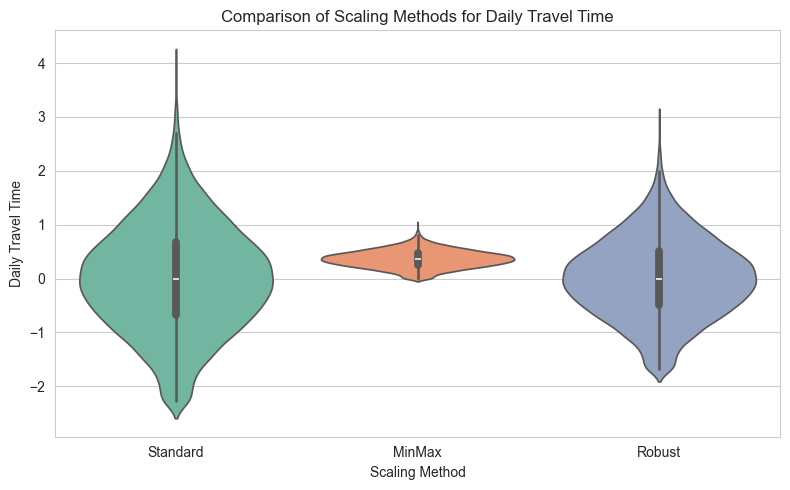

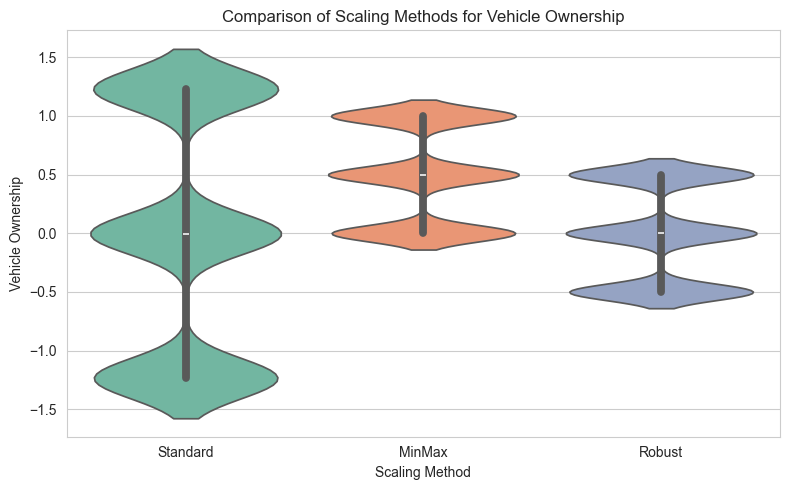

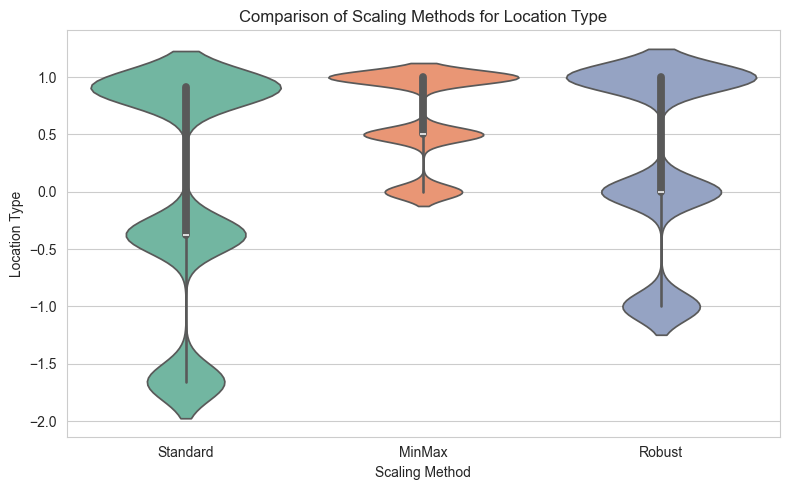

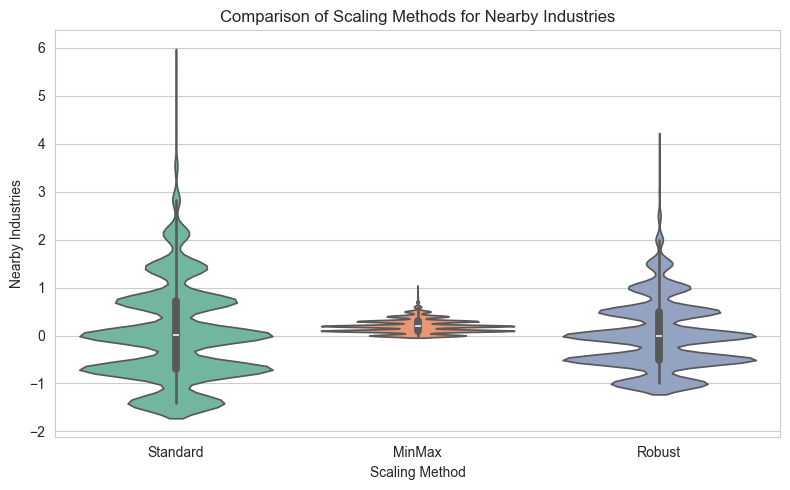

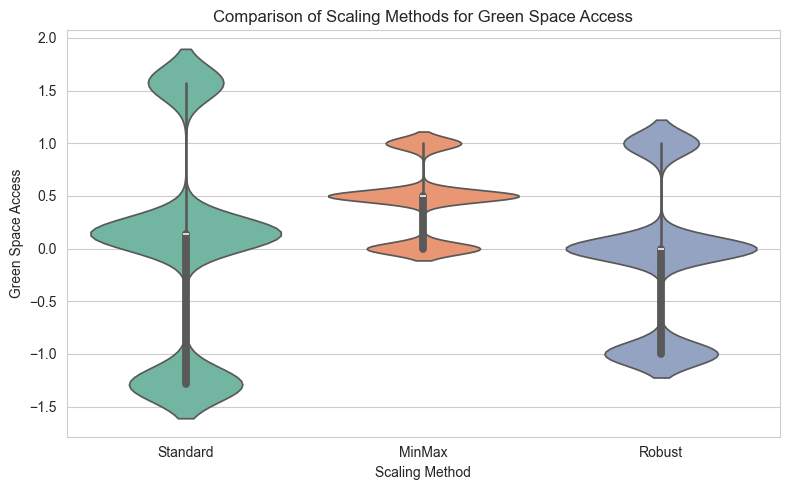

...

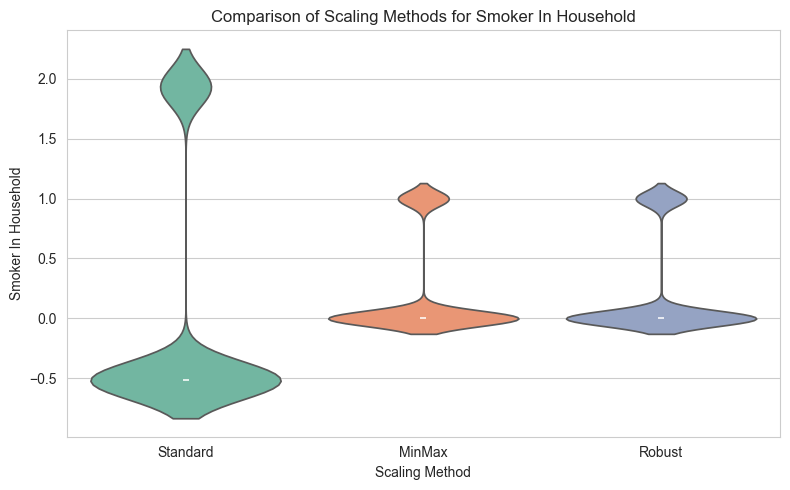

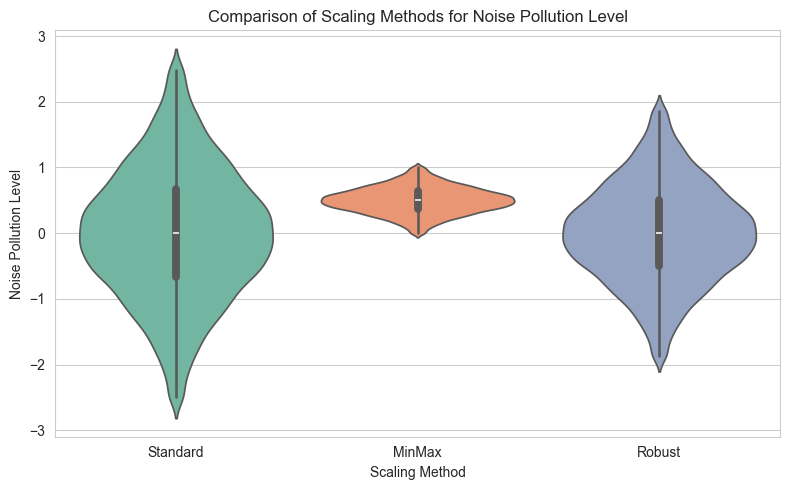

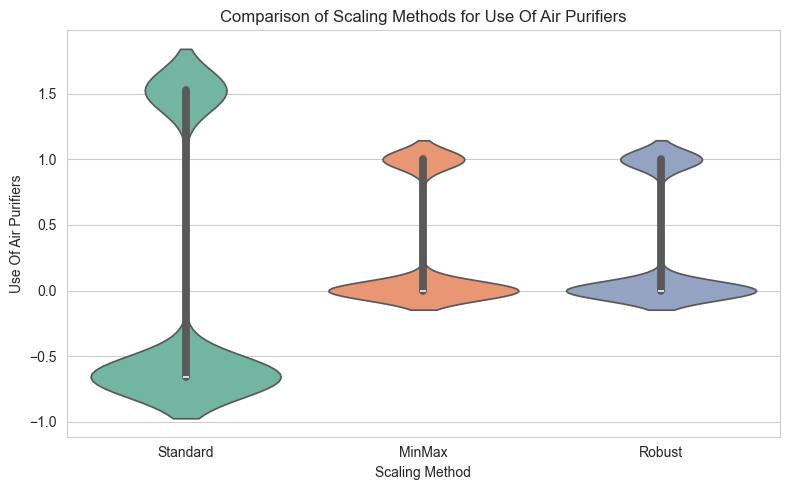

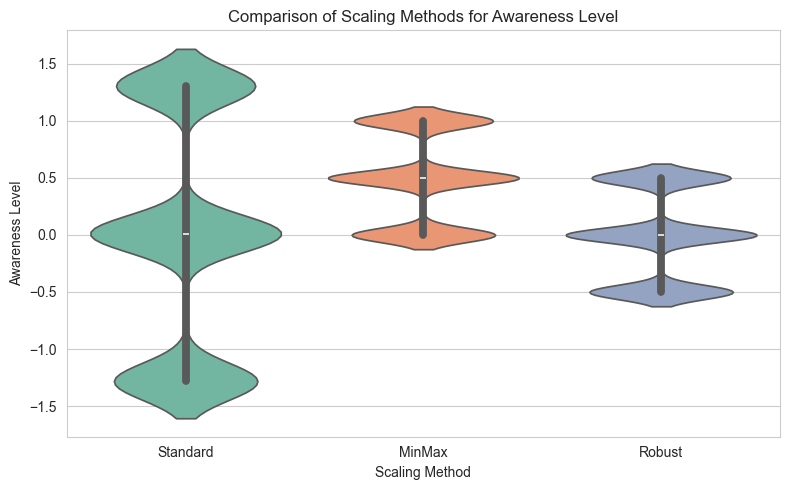

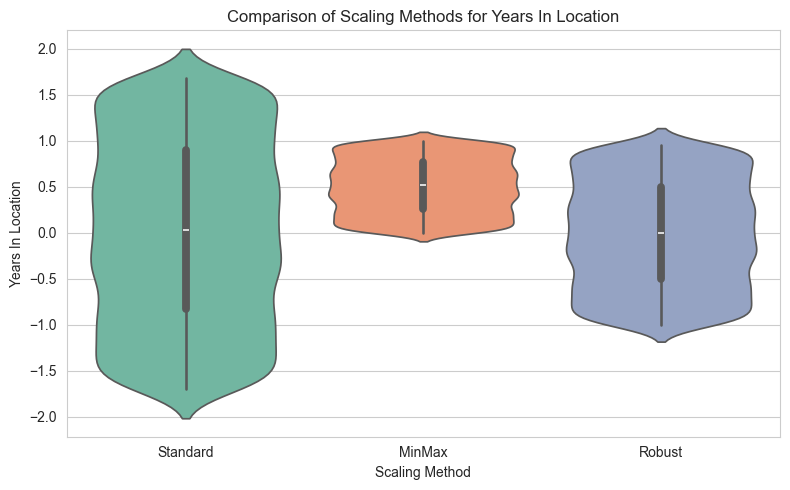

In [16]:
# Select numeric columns but exclude the target
num_cols = df_cat_encoded.select_dtypes(include="number").columns.drop(["risk_category", "pollution_exposure_score"])

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()

# --- 1) Standard Scaling ---
df_standard = df_cat_encoded.copy()
df_standard[num_cols] = standard_scaler.fit_transform(df_cat_encoded[num_cols])

# --- 2) Min-Max Scaling ---
df_minmax = df_cat_encoded.copy()
df_minmax[num_cols] = minmax_scaler.fit_transform(df_cat_encoded[num_cols])

# --- 3) Robust Scaling ---
df_robust = df_cat_encoded.copy()
df_robust[num_cols] = robust_scaler.fit_transform(df_cat_encoded[num_cols])

# Store results
scaled_dfs = {
    "Standard": {"df": df_standard},
    "MinMax": {"df": df_minmax},
    "Robust": {"df": df_robust}
}

# ✅ Visual comparison of scaling methods
for col in num_cols:
    plot_data = []
    for method, dfx in scaled_dfs.items():
        tmp = pd.DataFrame({
            "value": dfx["df"][col],
            "method": method
        })
        plot_data.append(tmp)

    plot_df = pd.concat(plot_data, ignore_index=True)

    plt.figure(figsize=(8, 5))
    sns.violinplot(
        data=plot_df,
        x="method",
        y="value",
        hue="method",
        dodge=False,
        legend=False,
        palette="Set2"
    )
    plt.title(f"Comparison of Scaling Methods for {col.replace('_',' ').title()}")
    plt.xlabel("Scaling Method")
    plt.ylabel(col.replace('_',' ').title())
    plt.tight_layout()
    plt.show()


Text(0.5, 1.0, 'Correlation Heatmap of Numeric Columns')

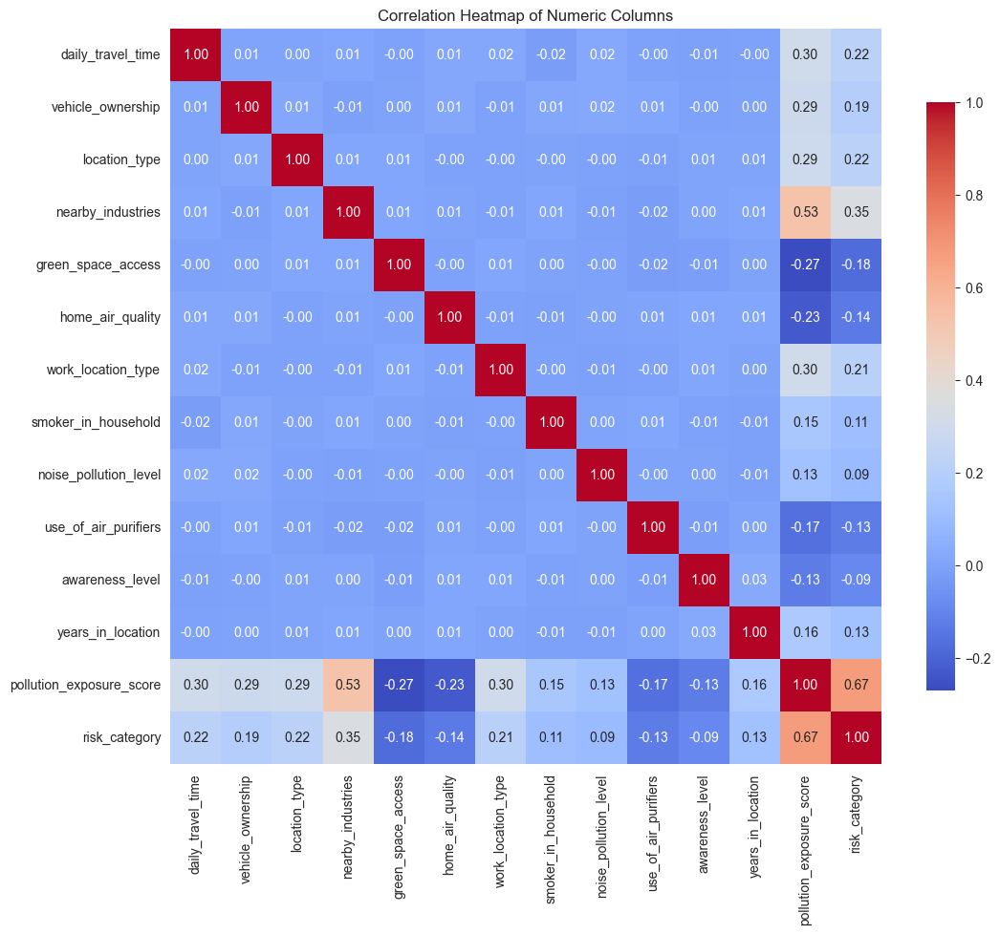

In [17]:
# Plot correlation heatmap of numeric columns
plt.figure(figsize=(12, 10))
corr = scaled_dfs["Standard"]["df"].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap of Numeric Columns")

# Classification

1. **Logistic Regression** — baseline, linear model
2. **Random Forest** — nonlinear, robust to noise
3. **XGBoost** — boosted trees, strong performance
4. **Support Vector Machine (SVM)** — good for structured data, but slower
5. **k-Nearest Neighbors (kNN)** — simple, sensitive to scaling

In [18]:
# Update scaled_dfs structure to store more info
for name, df_scaled in scaled_dfs.items():
    # Ensure each entry is a dict with the DataFrame under "df"
    if not isinstance(df_scaled, dict):
        df_scaled = {"df": df_scaled}

    df = df_scaled["df"]

    # --------------------
    # Classification setup
    # --------------------
    X_cls = df.drop(columns=["risk_category", "pollution_exposure_score"])
    y_cls = df["risk_category"]

    # Stratified train/test split
    X_train_cls, X_test_cls, y_train_cls, y_test_cls = train_test_split(
        X_cls, y_cls,
        test_size=0.2,
        random_state=42,
        stratify=y_cls
    )

    # Stratified K-Fold CV
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_splits_cls = []
    for train_idx, val_idx in skf.split(X_cls, y_cls):
        cv_splits_cls.append((
            X_cls.iloc[train_idx], X_cls.iloc[val_idx],
            y_cls.iloc[train_idx], y_cls.iloc[val_idx]
        ))

    df_scaled["classification"] = {
        "stratified": {
            "X_train": X_train_cls,
            "X_test": X_test_cls,
            "y_train": y_train_cls,
            "y_test": y_test_cls
        },
        "cv": cv_splits_cls
    }

    # ----------------
    # Regression setup
    # ----------------
    X_reg = df.drop(columns=["risk_category", "pollution_exposure_score"])
    y_reg = df["pollution_exposure_score"]

    # Regular (non-stratified) train/test split
    X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
        X_reg, y_reg,
        test_size=0.2,
        random_state=42
    )

    # K-Fold CV for regression
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_splits_reg = []
    for train_idx, val_idx in kf.split(X_reg):
        cv_splits_reg.append((
            X_reg.iloc[train_idx], X_reg.iloc[val_idx],
            y_reg.iloc[train_idx], y_reg.iloc[val_idx]
        ))

    df_scaled["regression"] = {
        "split": {
            "X_train": X_train_reg,
            "X_test": X_test_reg,
            "y_train": y_train_reg,
            "y_test": y_test_reg
        },
        "cv": cv_splits_reg
    }

    # Save back
    scaled_dfs[name] = df_scaled


In [19]:
for name, content in scaled_dfs.items():
    print(f"\n{name}: {list(content.keys())}")


Standard: ['df', 'classification', 'regression']

MinMax: ['df', 'classification', 'regression']

Robust: ['df', 'classification', 'regression']


In [20]:
# Define models
models = {
    "LogisticRegression": LogisticRegression(max_iter=500, random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42),
    "XGBoost": XGBClassifier(eval_metric="mlogloss", random_state=42),
    "SVM": SVC(kernel="rbf", probability=True, random_state=42),
    "kNN": KNeighborsClassifier(n_neighbors=5)
}

# Imputer strategies
imputer_strategies = ["mean", "median", "most_frequent", "constant"]

# Collect results
records = []

for scale_name, data in scaled_dfs.items():
    data = data["classification"]

    # Stratified Train/Test Split
    X_train = data["stratified"]["X_train"]
    X_test  = data["stratified"]["X_test"]
    y_train = data["stratified"]["y_train"]
    y_test  = data["stratified"]["y_test"]

    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            pipeline.fit(X_train, y_train)

            y_pred_train = pipeline.predict(X_train)
            y_pred_test  = pipeline.predict(X_test)

            # Proba for logloss & AUC
            if hasattr(pipeline.named_steps["model"], "predict_proba"):
                y_proba_test = pipeline.predict_proba(X_test)
                test_logloss = log_loss(y_test, y_proba_test)
                test_auc = roc_auc_score(y_test, y_proba_test, multi_class="ovr")
            else:
                test_logloss, test_auc = np.nan, np.nan

            # Train metrics
            acc_train = accuracy_score(y_train, y_pred_train)
            f1_train  = f1_score(y_train, y_pred_train, average="weighted")
            prec_train = precision_score(y_train, y_pred_train, average="weighted", zero_division=0)
            rec_train  = recall_score(y_train, y_pred_train, average="weighted")

            # Test metrics
            acc_test = accuracy_score(y_test, y_pred_test)
            f1_test  = f1_score(y_test, y_pred_test, average="weighted")
            prec_test = precision_score(y_test, y_pred_test, average="weighted", zero_division=0)
            rec_test  = recall_score(y_test, y_pred_test, average="weighted")

            print(f"[Stratified] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Test Acc={acc_test:.3f}, Test F1={f1_test:.3f}, LogLoss={test_logloss:.3f}, AUC={test_auc:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "stratified",
                "Train_Accuracy": acc_train,
                "Train_F1": f1_train,
                "Train_Precision": prec_train,
                "Train_Recall": rec_train,
                "Test_Accuracy": acc_test,
                "Test_F1": f1_test,
                "Test_Precision": prec_test,
                "Test_Recall": rec_test,
                "Test_LogLoss": test_logloss,
                "Test_AUC": test_auc
            })

    # Cross-validation
    cv_splits = data["cv"]
    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            fold_metrics = []
            for X_train, X_val, y_train, y_val in cv_splits:
                pipeline.fit(X_train, y_train)
                y_pred_val = pipeline.predict(X_val)

                if hasattr(pipeline.named_steps["model"], "predict_proba"):
                    y_proba_val = pipeline.predict_proba(X_val)
                    logloss_val = log_loss(y_val, y_proba_val)
                    auc_val = roc_auc_score(y_val, y_proba_val, multi_class="ovr")
                else:
                    logloss_val, auc_val = np.nan, np.nan

                acc_val = accuracy_score(y_val, y_pred_val)
                f1_val  = f1_score(y_val, y_pred_val, average="weighted")
                prec_val = precision_score(y_val, y_pred_val, average="weighted", zero_division=0)
                rec_val  = recall_score(y_val, y_pred_val, average="weighted")

                fold_metrics.append({
                    "Val_Accuracy": acc_val, "Val_F1": f1_val,
                    "Val_Precision": prec_val, "Val_Recall": rec_val,
                    "Val_LogLoss": logloss_val, "Val_AUC": auc_val
                })

            # Average across folds
            avg_metrics = {m: np.mean([fm[m] for fm in fold_metrics]) for m in fold_metrics[0]}

            print(f"[CV-Avg] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Val Acc={avg_metrics['Val_Accuracy']:.3f}, Val F1={avg_metrics['Val_F1']:.3f}, "
                  f"LogLoss={avg_metrics['Val_LogLoss']:.3f}, AUC={avg_metrics['Val_AUC']:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "cv",
                "Train_Accuracy": np.nan,
                "Train_F1": np.nan,
                "Train_Precision": np.nan,
                "Train_Recall": np.nan,
                "Test_Accuracy": avg_metrics["Val_Accuracy"],
                "Test_F1": avg_metrics["Val_F1"],
                "Test_Precision": avg_metrics["Val_Precision"],
                "Test_Recall": avg_metrics["Val_Recall"],
                "Test_LogLoss": avg_metrics["Val_LogLoss"],
                "Test_AUC": avg_metrics["Val_AUC"]
            })

# Convert to DataFrame
results_df = pd.DataFrame(records).sort_values(by="Test_F1", ascending=False)
results_df


[Stratified] Scaler=Standard, Imputer=mean, Model=LogisticRegression => Test Acc=0.914, Test F1=0.909, LogLoss=0.212, AUC=0.955
[Stratified] Scaler=Standard, Imputer=mean, Model=RandomForest => Test Acc=0.918, Test F1=0.904, LogLoss=0.227, AUC=0.960
[Stratified] Scaler=Standard, Imputer=mean, Model=XGBoost => Test Acc=0.939, Test F1=0.935, LogLoss=0.189, AUC=0.969
[Stratified] Scaler=Standard, Imputer=mean, Model=SVM => Test Acc=0.927, Test F1=0.921, LogLoss=0.184, AUC=0.960
[Stratified] Scaler=Standard, Imputer=mean, Model=kNN => Test Acc=0.901, Test F1=0.888, LogLoss=0.901, AUC=0.865
[Stratified] Scaler=Standard, Imputer=median, Model=LogisticRegression => Test Acc=0.915, Test F1=0.910, LogLoss=0.213, AUC=0.955
[Stratified] Scaler=Standard, Imputer=median, Model=RandomForest => Test Acc=0.918, Test F1=0.904, LogLoss=0.234, AUC=0.953
[Stratified] Scaler=Standard, Imputer=median, Model=XGBoost => Test Acc=0.937, Test F1=0.933, LogLoss=0.198, AUC=0.965
[Stratified] Scaler=Standard, Impu

,scaler,imputer,model,split_type,Train_Accuracy,Train_F1,Train_Precision,Train_Recall,Test_Accuracy,Test_F1,Test_Precision,Test_Recall,Test_LogLoss,Test_AUC
2,Standard,mean,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9385,0.934798,0.935556,0.9385,0.188955,0.969379
17,Standard,constant,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9385,0.934798,0.935556,0.9385,0.188955,0.969379
42,MinMax,mean,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9385,0.934798,0.935556,0.9385,0.188955,0.969379
82,Robust,mean,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9385,0.934798,0.935556,0.9385,0.188955,0.969379
47,MinMax,median,XGBoost,stratified,0.999750,0.999750,0.999750,0.999750,0.9370,0.932768,0.933983,0.9370,0.197773,0.965037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,MinMax,median,kNN,cv,NaN,NaN,NaN,NaN,0.8812,0.865121,0.866805,0.8812,1.202041,0.801353
74,MinMax,most_frequent,kNN,cv,NaN,NaN,NaN,NaN,0.8804,0.865064,0.866089,0.8804,1.208508,0.798990
54,MinMax,most_frequent,kNN,stratified,0.912375,0.901090,0.908165,0.912375,0.8835,0.865016,0.875040,0.8835,1.191819,0.801048
59,MinMax,constant,kNN,stratified,0.906625,0.893426,0.898437,0.906625,0.8775,0.856359,0.845919,0.8775,1.273346,0.780207


In [21]:
# Pick best model based on Test_F1
best_row = results_df.loc[results_df["Test_F1"].idxmax()]

best_scaler = best_row["scaler"]
best_imputer = best_row["imputer"]
best_model = best_row["model"]
best_split = best_row["split_type"]

print("Best model found:")
print(best_row)


Best model found:
scaler               Standard
imputer                  mean
model                 XGBoost
split_type         stratified
Train_Accuracy            1.0
Train_F1                  1.0
Train_Precision           1.0
Train_Recall              1.0
Test_Accuracy          0.9385
Test_F1              0.934798
Test_Precision       0.935556
Test_Recall            0.9385
Test_LogLoss         0.188955
Test_AUC             0.969379
Name: 2, dtype: object


In [22]:
# Now retrieve the data and rebuild the pipeline for that exact config
data = scaled_dfs[best_scaler]["classification"]

if best_split == "stratified":
    X_train = data["stratified"]["X_train"]
    y_train = data["stratified"]["y_train"]
else:
    X_train = pd.concat([d[0] for d in data["cv"]], axis=0)
    y_train = pd.concat([d[2] for d in data["cv"]], axis=0)

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy=best_imputer)),
    ("model", models[best_model])
])

# Fit the pipeline on best split data
pipeline.fit(X_train, y_train)

print(f"\n✅ Best pipeline retrained: {best_model} with {best_scaler} scaling and {best_imputer} imputer (split={best_split})")



✅ Best pipeline retrained: XGBoost with Standard scaling and mean imputer (split=stratified)


In [23]:
model_step = pipeline.named_steps["model"]

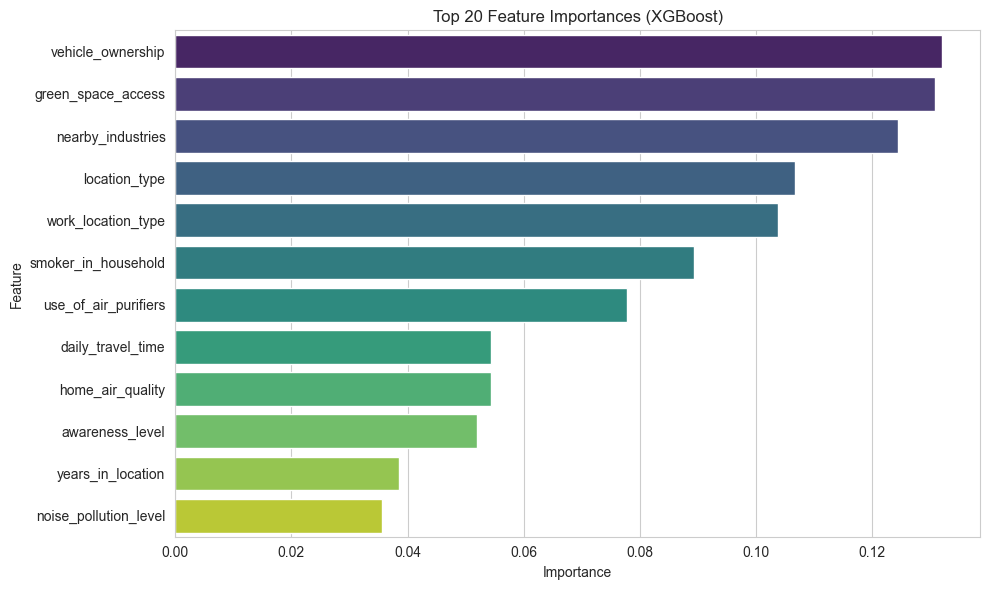

C:\Users\stefan.jovanovic_omi\AppData\Local\Temp\ipykernel_23432\2233351367.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")


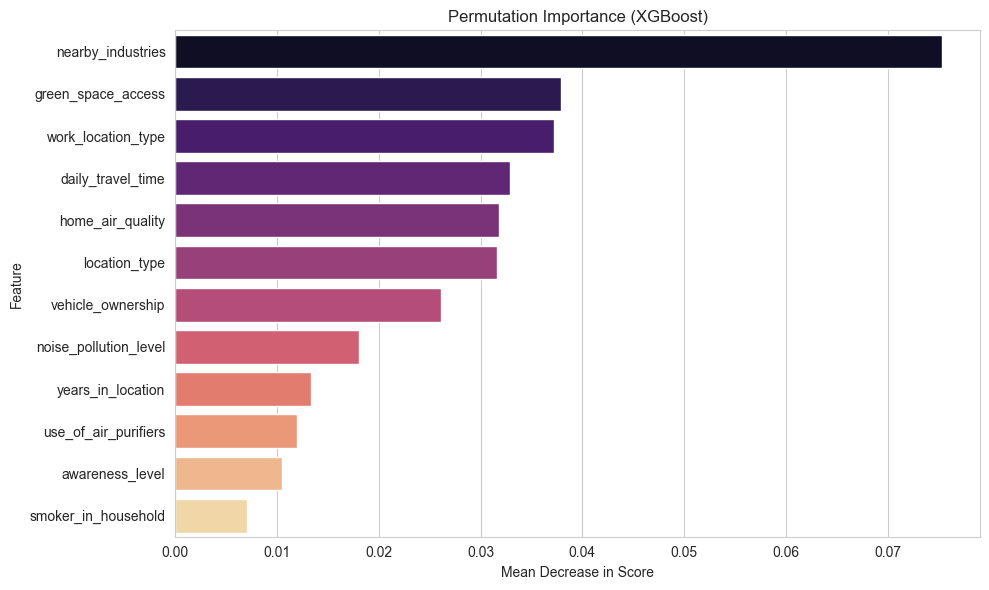

In [24]:
# Feature/Coefficient importance
if hasattr(model_step, "feature_importances_"):
    importances = model_step.feature_importances_
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Importance": importances
    }).sort_values("Importance", ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=fi_df.head(20),
        x="Importance", y="Feature",
        hue="Feature", palette="viridis", legend=False
    )
    plt.title(f"Top 20 Feature Importances ({best_model})")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

elif hasattr(model_step, "coef_"):
    coefs = model_step.coef_
    if coefs.ndim > 1:  # multiclass
        coefs = np.mean(coefs, axis=0)
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Coefficient": coefs
    }).sort_values("Coefficient", key=abs, ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=fi_df.head(20), x="Coefficient", y="Feature", palette="coolwarm")
    plt.title(f"Top 20 Coefficients ({best_model})")
    plt.xlabel("Coefficient")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

else:
    print("This model does not support native feature importance. Use SHAP or permutation importance.")

# Permutation importance
r = permutation_importance(model_step, X_train, y_train, n_repeats=10, random_state=42)
pi_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": r.importances_mean
}).sort_values("Importance", ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")
plt.title(f"Permutation Importance ({best_model})")
plt.xlabel("Mean Decrease in Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()



Partial Dependence for target class: 0


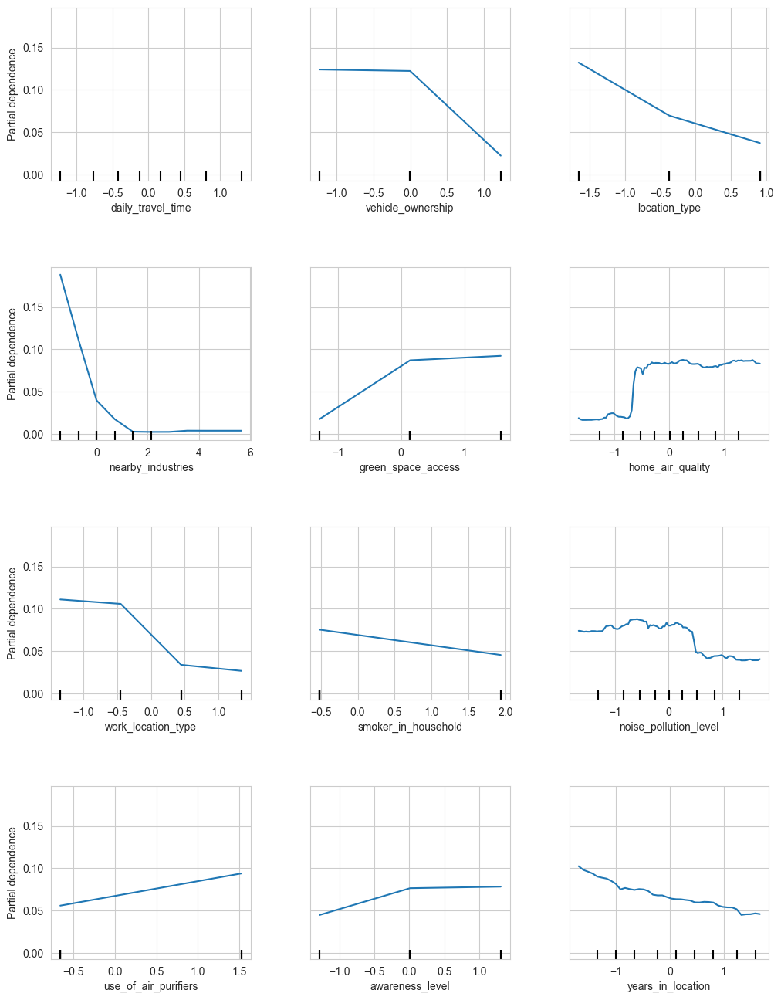


Partial Dependence for target class: 1


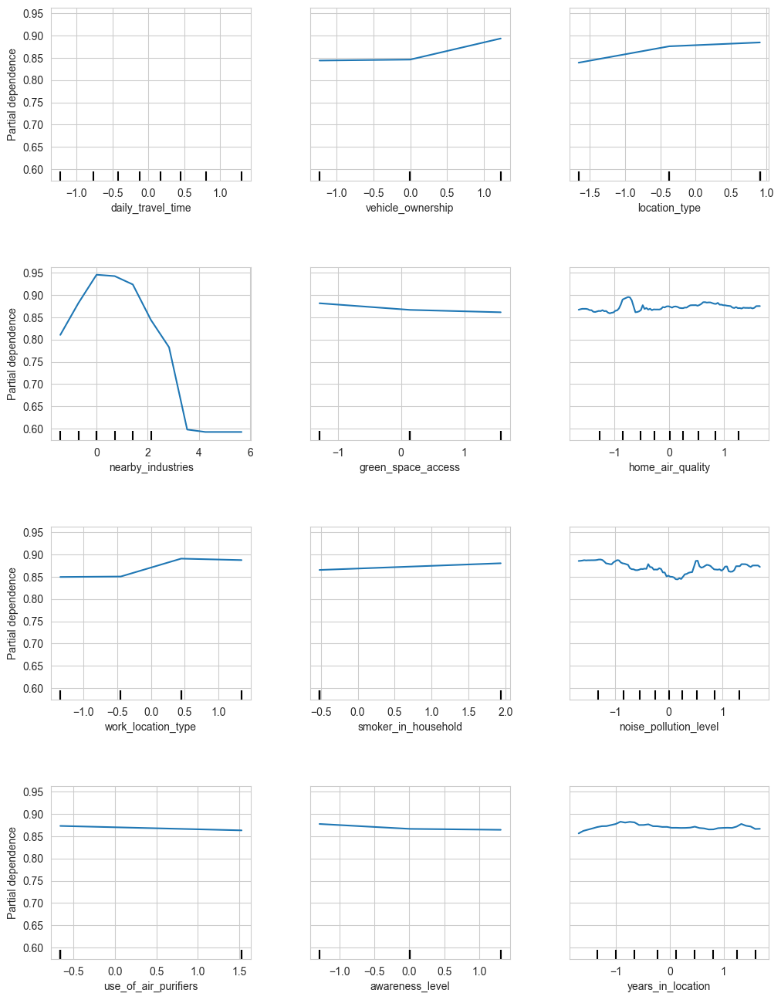


Partial Dependence for target class: 2


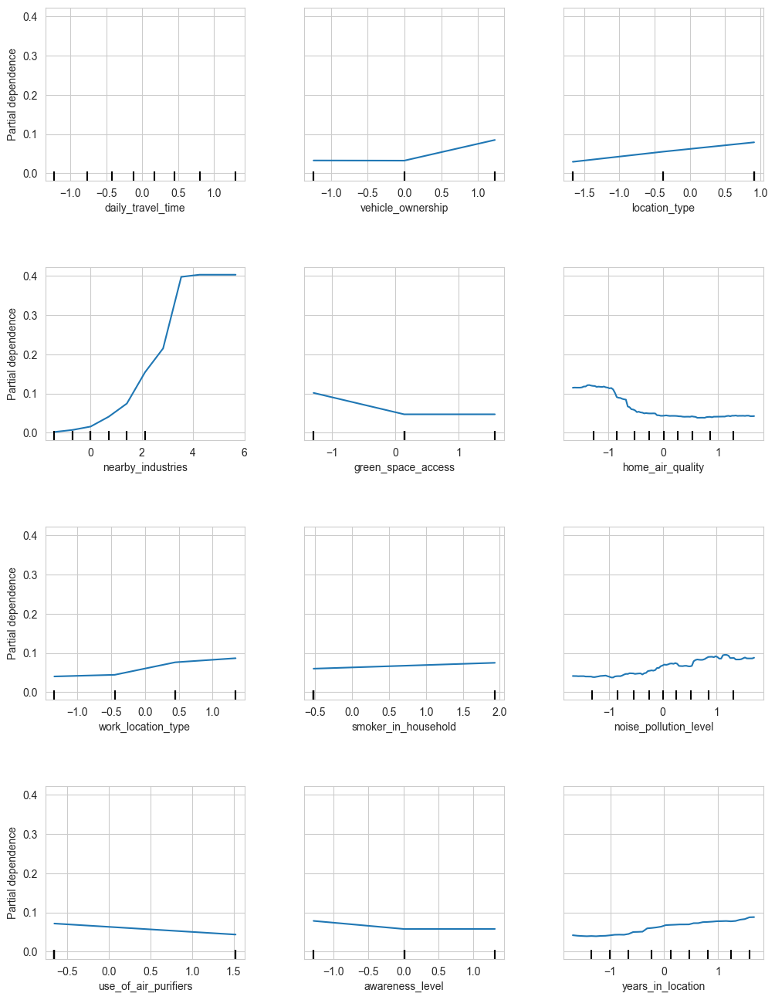

In [25]:
for target in range(len(model_step.classes_)):
    print(f"\nPartial Dependence for target class: {model_step.classes_[target]}")
    disp = PartialDependenceDisplay.from_estimator(
        model_step,
        X_train,
        list(range(X_train.shape[1])),
        target=target
    )
    disp.figure_.set_size_inches(12, 16)
    disp.figure_.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.show()

100%|===================| 23970/24000 [05:56<00:00]        

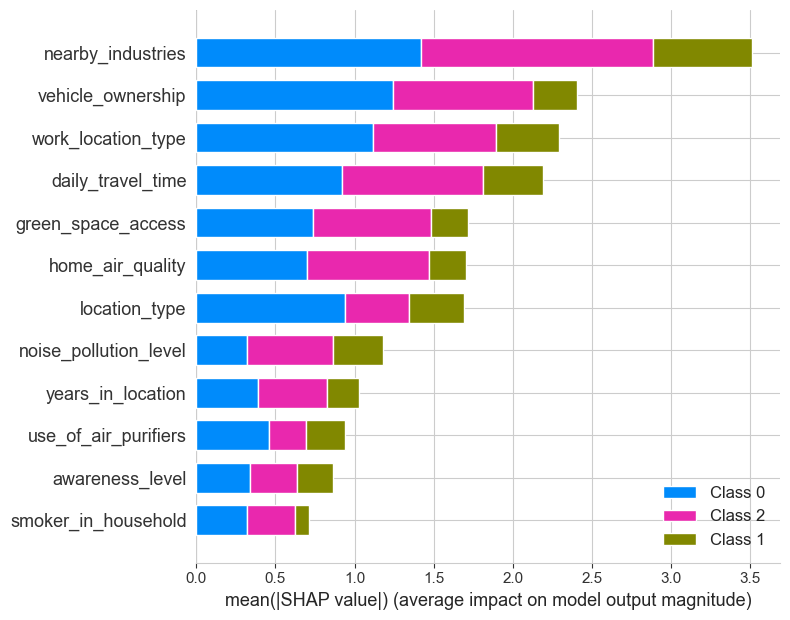

In [26]:
# SHAP
explainer = shap.Explainer(model_step, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)


✅ Best model: XGBoost with Standard scaling, mean imputer (split=stratified)


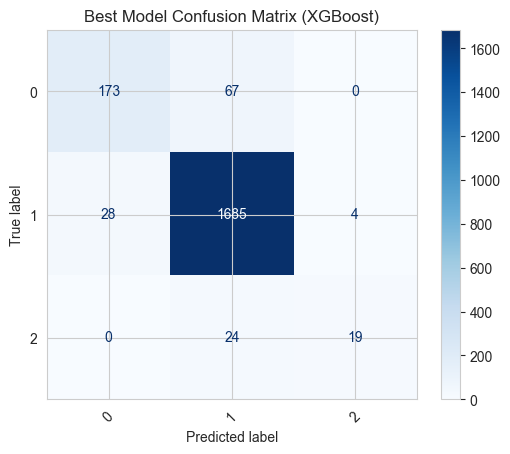


✅ Worst model: kNN with MinMax scaling, constant imputer (split=cv)


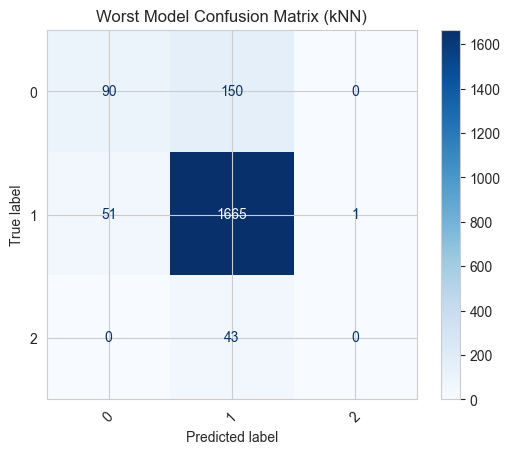

In [27]:
# Best vs Worst model confussion matrix
best_row = results_df.loc[results_df["Test_F1"].idxmax()]
worst_row = results_df.loc[results_df["Test_F1"].idxmin()]

for row, label in [(best_row, "Best"), (worst_row, "Worst")]:
    best_scaler = row["scaler"]
    best_imputer = row["imputer"]
    best_model = row["model"]
    best_split = row["split_type"]

    print(f"\n✅ {label} model: {best_model} with {best_scaler} scaling, {best_imputer} imputer (split={best_split})")

    # Retrieve classification dataset
    data = scaled_dfs[best_scaler]["classification"]

    X_train = data["stratified"]["X_train"]
    X_test = data["stratified"]["X_test"]
    y_train = data["stratified"]["y_train"]
    y_test = data["stratified"]["y_test"]

    # Rebuild pipeline
    pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy=best_imputer)),
        ("model", models[best_model])
    ])

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    # Plot confusion matrix
    disp = ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        cmap="Blues",
        xticks_rotation=45
    )
    disp.ax_.set_title(f"{label} Model Confusion Matrix ({best_model})")
    plt.show()

# Regression

1. **Linear Regression** — baseline, linear model
2. **Random Forest Regressor** — nonlinear, robust to noise
3. **XGBoost Regressor** — boosted trees, strong performance
4. **Support Vector Regression (SVR)** — good for structured data, but slower
5. **k-Nearest Neighbors Regressor (kNN Regressor)** — simple, sensitive to scaling

In [28]:
# Define regression models
models = {
    "LinearRegression": LinearRegression(),
    "RandomForestRegressor": RandomForestRegressor(n_estimators=200, random_state=42),
    "XGBRegressor": XGBRegressor(objective="reg:squarederror", random_state=42),
    "SVR": SVR(kernel="rbf"),
    "kNNRegressor": KNeighborsRegressor(n_neighbors=5)
}

# Imputer strategies
imputer_strategies = ["mean", "median", "most_frequent", "constant"]

# Collect results
records = []

for scale_name, data in scaled_dfs.items():
    data = data["regression"]

    # Standard Train/Test Split
    X_train = data["split"]["X_train"]
    X_test  = data["split"]["X_test"]
    y_train = data["split"]["y_train"]
    y_test  = data["split"]["y_test"]

    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            pipeline.fit(X_train, y_train)

            y_pred_train = pipeline.predict(X_train)
            y_pred_test  = pipeline.predict(X_test)

            # Train metrics
            mse_train = mean_squared_error(y_train, y_pred_train)
            rmse_train = np.sqrt(mse_train)
            mae_train = mean_absolute_error(y_train, y_pred_train)
            r2_train  = r2_score(y_train, y_pred_train)

            # Test metrics
            mse_test = mean_squared_error(y_test, y_pred_test)
            rmse_test = np.sqrt(mse_test)
            mae_test = mean_absolute_error(y_test, y_pred_test)
            r2_test  = r2_score(y_test, y_pred_test)

            print(f"[Split] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Test RMSE={rmse_test:.3f}, Test MAE={mae_test:.3f}, R²={r2_test:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "split",
                "Train_MSE": mse_train,
                "Train_RMSE": rmse_train,
                "Train_MAE": mae_train,
                "Train_R2": r2_train,
                "Test_MSE": mse_test,
                "Test_RMSE": rmse_test,
                "Test_MAE": mae_test,
                "Test_R2": r2_test
            })

    # Cross-validation
    cv_splits = data["cv"]
    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            fold_metrics = []
            for X_train, X_val, y_train, y_val in cv_splits:
                pipeline.fit(X_train, y_train)
                y_pred_val = pipeline.predict(X_val)

                mse_val = mean_squared_error(y_val, y_pred_val)
                rmse_val = np.sqrt(mse_val)
                mae_val = mean_absolute_error(y_val, y_pred_val)
                r2_val  = r2_score(y_val, y_pred_val)

                fold_metrics.append({
                    "Val_MSE": mse_val, "Val_RMSE": rmse_val,
                    "Val_MAE": mae_val, "Val_R2": r2_val
                })

            # Average across folds
            avg_metrics = {m: np.mean([fm[m] for fm in fold_metrics]) for m in fold_metrics[0]}

            print(f"[CV-Avg] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Val RMSE={avg_metrics['Val_RMSE']:.3f}, Val MAE={avg_metrics['Val_MAE']:.3f}, R²={avg_metrics['Val_R2']:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "cv",
                "Train_MSE": np.nan,
                "Train_RMSE": np.nan,
                "Train_MAE": np.nan,
                "Train_R2": np.nan,
                "Test_MSE": avg_metrics["Val_MSE"],
                "Test_RMSE": avg_metrics["Val_RMSE"],
                "Test_MAE": avg_metrics["Val_MAE"],
                "Test_R2": avg_metrics["Val_R2"]
            })

# Convert to DataFrame
results_reg_df = pd.DataFrame(records).sort_values(by="Test_MAE", ascending=True)
results_reg_df


[Split] Scaler=Standard, Imputer=mean, Model=LinearRegression => Test RMSE=5.315, Test MAE=4.184, R²=0.809
[Split] Scaler=Standard, Imputer=mean, Model=RandomForestRegressor => Test RMSE=4.697, Test MAE=3.467, R²=0.850
[Split] Scaler=Standard, Imputer=mean, Model=XGBRegressor => Test RMSE=3.827, Test MAE=2.640, R²=0.901
[Split] Scaler=Standard, Imputer=mean, Model=SVR => Test RMSE=4.618, Test MAE=3.352, R²=0.856
[Split] Scaler=Standard, Imputer=mean, Model=kNNRegressor => Test RMSE=6.014, Test MAE=4.632, R²=0.755
[Split] Scaler=Standard, Imputer=median, Model=LinearRegression => Test RMSE=5.333, Test MAE=4.186, R²=0.807
[Split] Scaler=Standard, Imputer=median, Model=RandomForestRegressor => Test RMSE=4.772, Test MAE=3.518, R²=0.846
[Split] Scaler=Standard, Imputer=median, Model=XGBRegressor => Test RMSE=3.948, Test MAE=2.737, R²=0.894
[Split] Scaler=Standard, Imputer=median, Model=SVR => Test RMSE=4.638, Test MAE=3.365, R²=0.854
[Split] Scaler=Standard, Imputer=median, Model=kNNRegress

,scaler,imputer,model,split_type,Train_MSE,Train_RMSE,Train_MAE,Train_R2,Test_MSE,Test_RMSE,Test_MAE,Test_R2
37,Standard,constant,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.645766,3.693127,2.611214,0.906274
22,Standard,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.730202,3.704223,2.613299,0.905716
62,MinMax,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.730202,3.704223,2.613299,0.905716
102,Robust,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.730202,3.704223,2.613299,0.905716
17,Standard,constant,XGBRegressor,split,3.129204,1.768956,1.229899,0.978455,14.353274,3.788572,2.639898,0.902731
...,...,...,...,...,...,...,...,...,...,...,...,...
64,MinMax,mean,kNNRegressor,cv,NaN,NaN,NaN,NaN,57.448170,7.578061,5.969710,0.605353
69,MinMax,median,kNNRegressor,cv,NaN,NaN,NaN,NaN,57.665622,7.592465,5.979452,0.603842
74,MinMax,most_frequent,kNNRegressor,cv,NaN,NaN,NaN,NaN,59.634988,7.720992,6.070240,0.590296
59,MinMax,constant,kNNRegressor,split,41.962114,6.477817,5.111003,0.711085,64.411219,8.025660,6.246935,0.563499


In [29]:
# Pick best model based on Test_F1
best_row = results_reg_df.iloc[0]

best_scaler = best_row["scaler"]
best_imputer = best_row["imputer"]
best_model = best_row["model"]
best_split = best_row["split_type"]

print("Best model found:")
print(best_row)

Best model found:
scaler            Standard
imputer           constant
model         XGBRegressor
split_type              cv
Train_MSE              NaN
Train_RMSE             NaN
Train_MAE              NaN
Train_R2               NaN
Test_MSE         13.645766
Test_RMSE         3.693127
Test_MAE          2.611214
Test_R2           0.906274
Name: 37, dtype: object


In [30]:
# Now retrieve the data and rebuild the pipeline for that exact config
data = scaled_dfs[best_scaler]["regression"]

X_train = data["split"]["X_train"]
y_train = data["split"]["y_train"]

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy=best_imputer)),
    ("model", models[best_model])
])

# Fit the pipeline on best split data
pipeline.fit(X_train, y_train)

print(f"\n✅ Best pipeline retrained: {best_model} with {best_scaler} scaling and {best_imputer} imputer (split={best_split})")



✅ Best pipeline retrained: XGBRegressor with Standard scaling and constant imputer (split=cv)


In [31]:
model_step = pipeline.named_steps["model"]

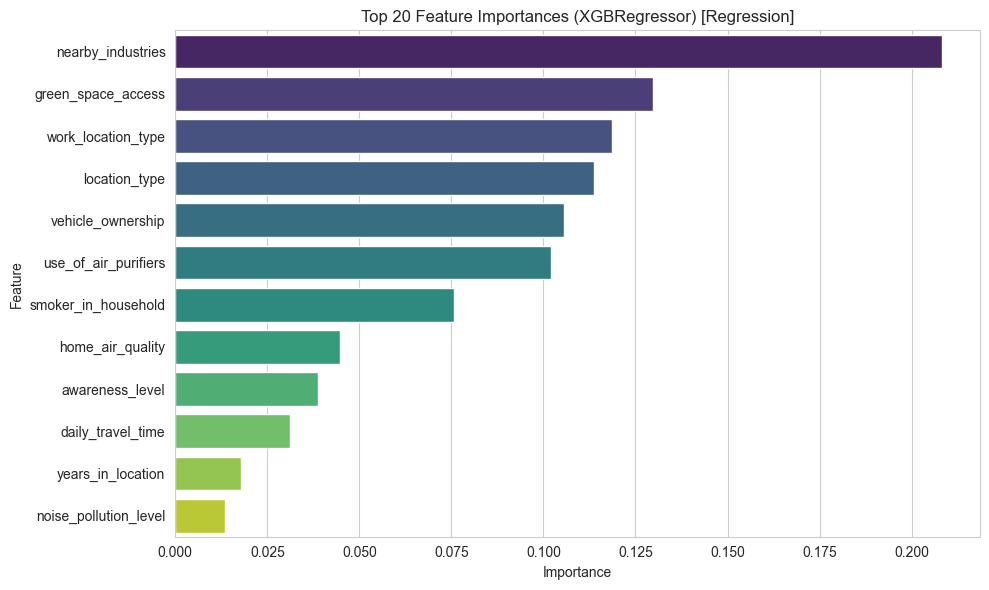

C:\Users\stefan.jovanovic_omi\AppData\Local\Temp\ipykernel_23432\3480822074.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")


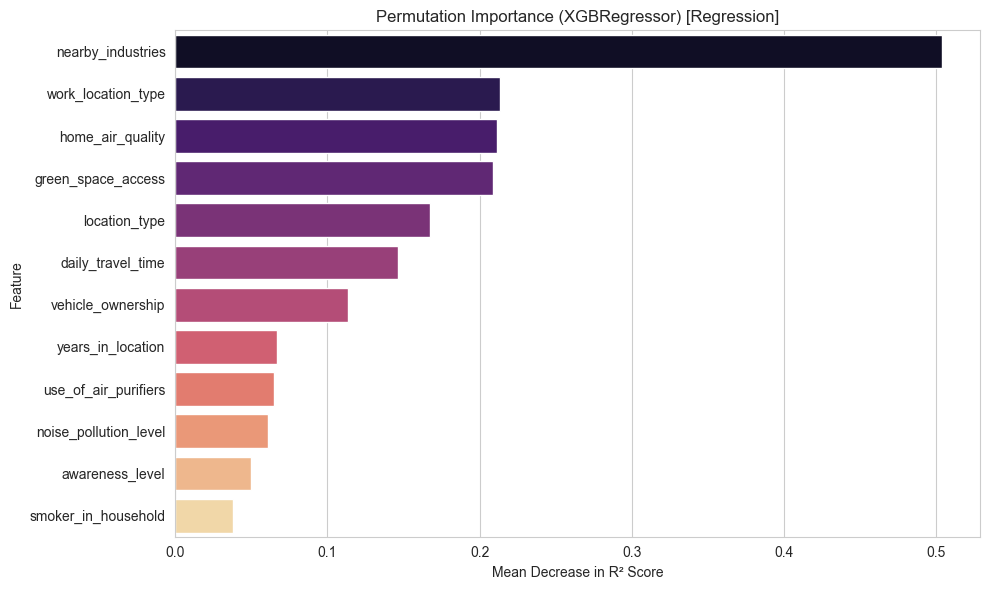

In [32]:
# Native feature importance or coefficients
if hasattr(model_step, "feature_importances_"):   # Tree-based models (RF, XGB, etc.)
    importances = model_step.feature_importances_
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Importance": importances
    }).sort_values("Importance", ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=fi_df.head(20),
        x="Importance", y="Feature",
        hue="Feature", palette="viridis", legend=False
    )
    plt.title(f"Top 20 Feature Importances ({best_model}) [Regression]")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

elif hasattr(model_step, "coef_"):   # Linear regression, SVR (linear kernel), etc.
    coefs = model_step.coef_
    if coefs.ndim > 1:  # Multiple outputs (rare in regression)
        coefs = np.mean(coefs, axis=0)
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Coefficient": coefs
    }).sort_values("Coefficient", key=abs, ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=fi_df.head(20), x="Coefficient", y="Feature", palette="coolwarm")
    plt.title(f"Top 20 Coefficients ({best_model}) [Regression]")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

else:
    print("This model does not support native feature importance. Falling back to permutation importance.")

# Permutation importance (works for any regression model)
r = permutation_importance(model_step, X_train, y_train, n_repeats=10, random_state=42)

pi_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": r.importances_mean
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")
plt.title(f"Permutation Importance ({best_model}) [Regression]")
plt.xlabel("Mean Decrease in R² Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


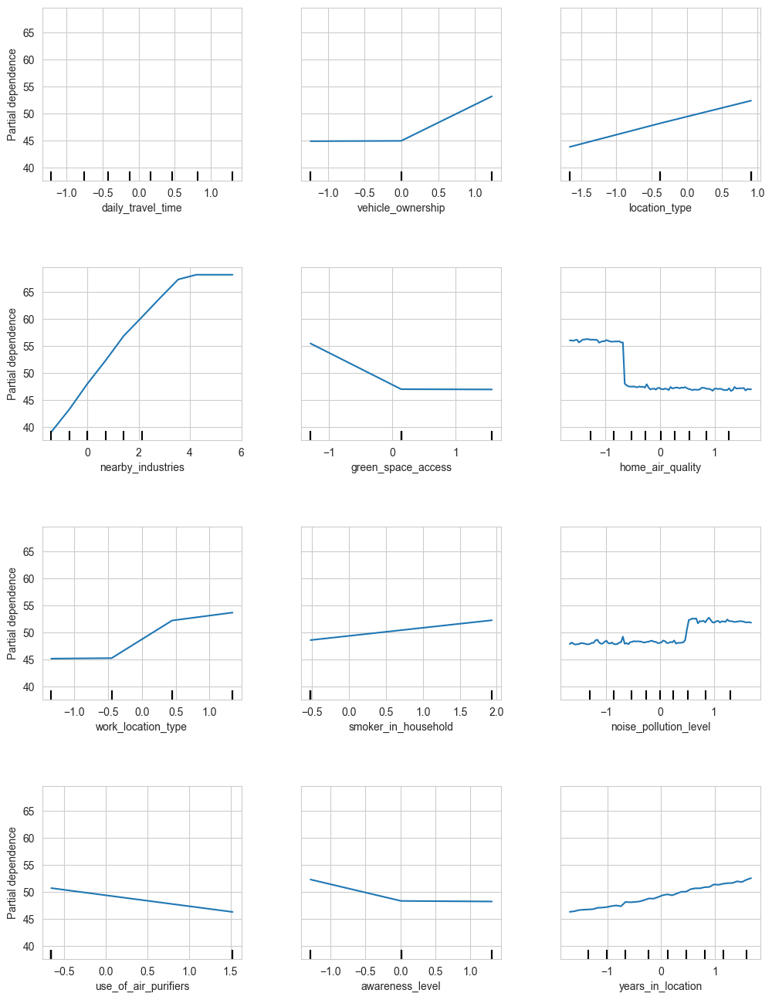

In [33]:
disp = PartialDependenceDisplay.from_estimator(
    model_step,
    X_train,
    list(range(X_train.shape[1]))
)
disp.figure_.set_size_inches(12, 16)
disp.figure_.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

 99%|===================| 7893/8000 [00:30<00:00]        

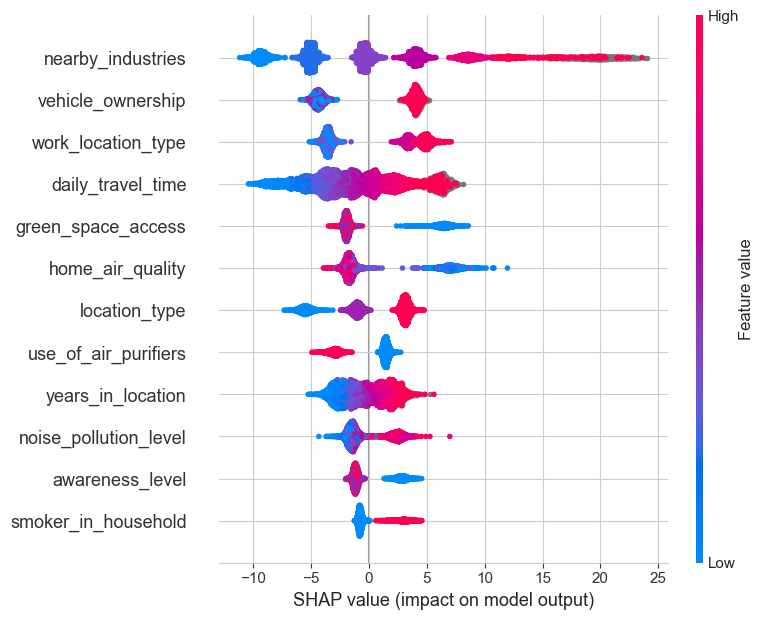

In [34]:
# SHAP
explainer = shap.Explainer(model_step, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

In [35]:
y_test

6252    41.36
4684    41.45
1731    39.45
4742    57.04
4521    56.23
        ...  
6412    16.51
8285    82.07
7853    70.86
1095    55.33
6929    51.26
Name: pollution_exposure_score, Length: 2000, dtype: float64

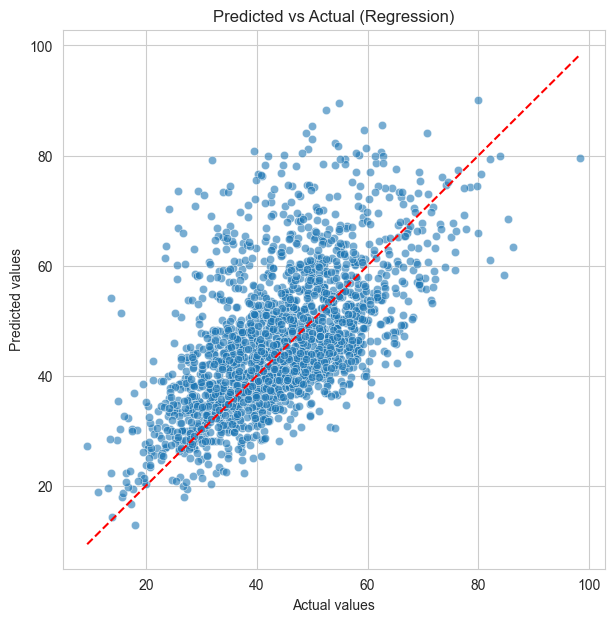

In [39]:
# Predict on test set
y_pred = model_step.predict(X_test)

plt.figure(figsize=(7,7))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Predicted vs Actual (Regression)")
plt.show()


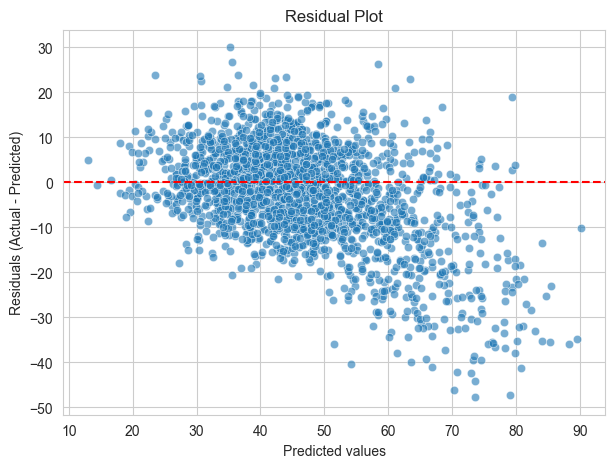

In [37]:
residuals = y_test - y_pred

plt.figure(figsize=(7,5))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Predicted values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.title("Residual Plot")
plt.show()

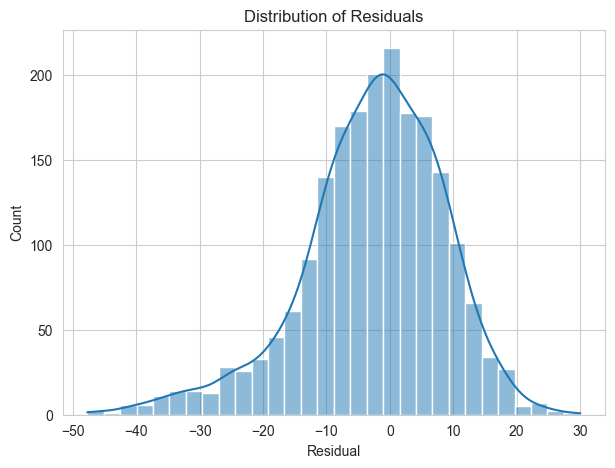

In [38]:
plt.figure(figsize=(7,5))
sns.histplot(residuals, bins=30, kde=True)
plt.xlabel("Residual")
plt.title("Distribution of Residuals")
plt.show()
